### Problem Statement:

<b>Main Statement:</b> How may we improve the traffic congestion for Southeast Asia's roads by leveraging Grab's booking demand data?

<b>Scoped Statement 1:</b> Can we <font color=red>accurately forecast travel demand </font> based on historical Grab bookings to predict <font color=blue>areas</font> and <font color=blue>times</font> with high travel demand?

In this assignment, Grab bookings are used as proxies for travel demand. By accurately predicting where and when travel demand ebbs and flows, Grab, along with other ecosystem partners (Buses and Trains), are able to cater to this demand (GrabShuttle-type of services perhaps), thereby 
    1) improving traffic congestion in the city,
    2) reducing waiting time for riders that choose to take rides as they can forecast demand ahead of time, and
    3) lowering idling time for drivers as they know where the demand will be next.

<b>Scoped Statement 2:</b> The model should be able to accurately <font color=red>forecast ahead by T+1 to T+5 time intervals </font>(where each interval is 15-min) given all data up to time T.

This refines our thesis. We have to predict travel demand 1 hours ahead, down to the exact geography and time. Let us assume the test set will be the same as our "Demand" data, all except the y-feature "demand".

__Contextual Knowledge - Pricing based on small geographical squares:__
"To calculate fares, our pricing algorithm divides Singapore into many small and identical zones on the map, following latitude and longitude lines. Hence, two pick-up locations that are near each other can be in two different zones, which may have different demand and supply conditions at any one time. This does mean Building A may show a different fare from Building B, even if they are nearby.

We know the fare difference in some cases are large, and we are working on ways to reduce variance in fares between two such zones."

From: https://www.grab.com/sg/blog/news/askgrab-pricing/

__Contextual Knowledge - Grab Widget for customers as existing solution:__
This will also be used in the Grab widget, which predicts demand conditions based on historical trends. 
"This widget shows you demand trends, based on the summation of historical data for a passenger’s specific location. The goal here is to encourage time-insensitive demand (passengers who don’t need a ride immediately) to book slightly later, helping passengers with more urgent needs to get allocated with higher ease.

![title](img/GrabWidget.png)

As testimony to its usefulness, the Travel Trends Widget is now ranked #1 among all of Grab’s widgets! With the highest number of click-throughs, we have observed that hundreds of thousands of people are finding it useful for their daily use! Watch out for the next upgraded version as we continue to improve it to be __more contextual and smart!__"

From: https://engineering.grab.com/understanding-supply-demand-ride-hailing-data

__Contextual Knowledge - Heatmap for Drivers as existing solution:__
If it is accurate, it could also be used for the drivers' heatmap feature.

![title](img/HeatmapsDriver.png)

From: https://www.grab.com/sg/driver/better365/demandheatmap/

__What I hope to achieve__:
1. A more accurate prediction than the current model based solely on these features
2. Creative business use cases from my model
3. Useful Features that can aid the internal team at Grab

### Library Imports

Let us begin this assignment by importing the necessary Python libraries!

In [1]:
# Data manipulation
import pandas as pd 
import numpy as np

# GeoData manipulation
import Geohash
import geopandas as gpd
from shapely.geometry import Point

# Plotting Data
import seaborn as sns
import matplotlib.pyplot as plt
% matplotlib inline

UsageError: Line magic function `%` not found.


### Data Reading and Manipulation

Now, we go on to reading in our data

In [2]:
df = pd.read_csv('data/training.csv')

In [3]:
df = df.sort_values(['day', 'timestamp'], ascending=[1, 1])
df.tail()

,geohash6,day,timestamp,demand
4164258,qp02zd,61,9:45,0.024494
4169765,qp03px,61,9:45,0.052964
4188616,qp03y3,61,9:45,0.001341
4197119,qp094m,61,9:45,0.124613
4202449,qp09et,61,9:45,0.120167


So far so good. Let us decode the geohash to form a latitude & longitude pair for later visualisation

In [4]:
df['geohash6'] = df['geohash6'].astype(str)
df['coordinates'] = df['geohash6'].apply(lambda x: Geohash.decode(x))
df[['latitude', 'longitude']] = pd.DataFrame(df['coordinates'].tolist(), index=df.index)  
df.head()

,geohash6,day,timestamp,demand,coordinates,latitude,longitude
2289,qp09sx,1,0:0,0.021212,"(-5.32012939453125, 90.9063720703125)",-5.320129,90.906372
3149,qp0dhg,1,0:0,0.013217,"(-5.25421142578125, 90.9173583984375)",-5.254211,90.917358
11052,qp03x5,1,0:0,0.157956,"(-5.34210205078125, 90.6646728515625)",-5.342102,90.664673
23011,qp09bw,1,0:0,0.001262,"(-5.28167724609375, 90.7305908203125)",-5.281677,90.730591
26180,qp03wn,1,0:0,0.032721,"(-5.32562255859375, 90.6207275390625)",-5.325623,90.620728


We follow this with making each pair a point in GeoPandas

In [5]:
df['Coordinates_point'] = list(zip(df['longitude'], df['latitude']))
df['Coordinates_point'] = df['Coordinates_point'].apply(Point)
df_geo = gpd.GeoDataFrame(df, geometry='Coordinates_point')
print(df_geo.head()) 

      geohash6  day timestamp    demand  \
2289    qp09sx    1       0:0  0.021212   
3149    qp0dhg    1       0:0  0.013217   
11052   qp03x5    1       0:0  0.157956   
23011   qp09bw    1       0:0  0.001262   
26180   qp03wn    1       0:0  0.032721   

                                 coordinates  latitude  longitude  \
2289   (-5.32012939453125, 90.9063720703125) -5.320129  90.906372   
3149   (-5.25421142578125, 90.9173583984375) -5.254211  90.917358   
11052  (-5.34210205078125, 90.6646728515625) -5.342102  90.664673   
23011  (-5.28167724609375, 90.7305908203125) -5.281677  90.730591   
26180  (-5.32562255859375, 90.6207275390625) -5.325623  90.620728   

                                Coordinates_point  
2289   POINT (90.9063720703125 -5.32012939453125)  
3149   POINT (90.9173583984375 -5.25421142578125)  
11052  POINT (90.6646728515625 -5.34210205078125)  
23011  POINT (90.7305908203125 -5.28167724609375)  
26180  POINT (90.6207275390625 -5.32562255859375)  


And also the timestamp so it can order the data points correctly

In [6]:
df['timestamp_float'] = pd.to_datetime(df['timestamp'], format='%H:%M').dt.hour + pd.to_datetime(df['timestamp'], format='%H:%M').dt.minute/60.0
df['timestamp'] = pd.to_datetime(df['timestamp'], format='%H:%M').dt.time


In [7]:
df = df.sort_values(['day', 'timestamp'], ascending=[1, 0])
df.tail()

,geohash6,day,timestamp,demand,coordinates,latitude,longitude,Coordinates_point,timestamp_float
4186274,qp03wj,61,00:00:00,0.066077,"(-5.33111572265625, 90.6207275390625)",-5.331116,90.620728,POINT (90.6207275390625 -5.33111572265625),0.0
4186801,qp0d49,61,00:00:00,0.012398,"(-5.26519775390625, 90.8184814453125)",-5.265198,90.818481,POINT (90.8184814453125 -5.26519775390625),0.0
4186920,qp09s3,61,00:00:00,0.001617,"(-5.35308837890625, 90.8953857421875)",-5.353088,90.895386,POINT (90.8953857421875 -5.35308837890625),0.0
4193503,qp09bw,61,00:00:00,0.006918,"(-5.28167724609375, 90.7305908203125)",-5.281677,90.730591,POINT (90.7305908203125 -5.28167724609375),0.0
4204314,qp03w8,61,00:00:00,0.184475,"(-5.35858154296875, 90.6427001953125)",-5.358582,90.642700,POINT (90.6427001953125 -5.35858154296875),0.0


Looks good so far!

### EDA: Exploratory Data Analysis

Let us try to find out what our data looks like. IF there are any "problems" with the data, we can try to fix it before running our models on them


In [8]:
df.describe()

,day,demand,latitude,longitude,timestamp_float
count,4.206321e+06,4.206321e+06,4.206321e+06,4.206321e+06,4.206321e+06
mean,3.145299e+01,1.050907e-01,-5.347428e+00,9.076412e+01,1.019052e+01
std,1.768278e+01,1.592655e-01,5.670886e-02,1.027662e-01,6.543432e+00
min,1.000000e+00,3.092217e-09,-5.484924e+00,9.058777e+01,0.000000e+00
25%,1.600000e+01,1.867379e-02,-5.391541e+00,9.067566e+01,4.750000e+00
50%,3.200000e+01,5.043463e-02,-5.347595e+00,9.075256e+01,9.500000e+00
75%,4.700000e+01,1.208644e-01,-5.303650e+00,9.085144e+01,1.475000e+01
max,6.100000e+01,1.000000e+00,-5.237732e+00,9.097229e+01,2.375000e+01


No null data, which is good news for us

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4206321 entries, 1121 to 4204314
Data columns (total 9 columns):
geohash6             object
day                  int64
timestamp            object
demand               float64
coordinates          object
latitude             float64
longitude            float64
Coordinates_point    object
timestamp_float      float64
dtypes: float64(4), int64(1), object(4)
memory usage: 320.9+ MB


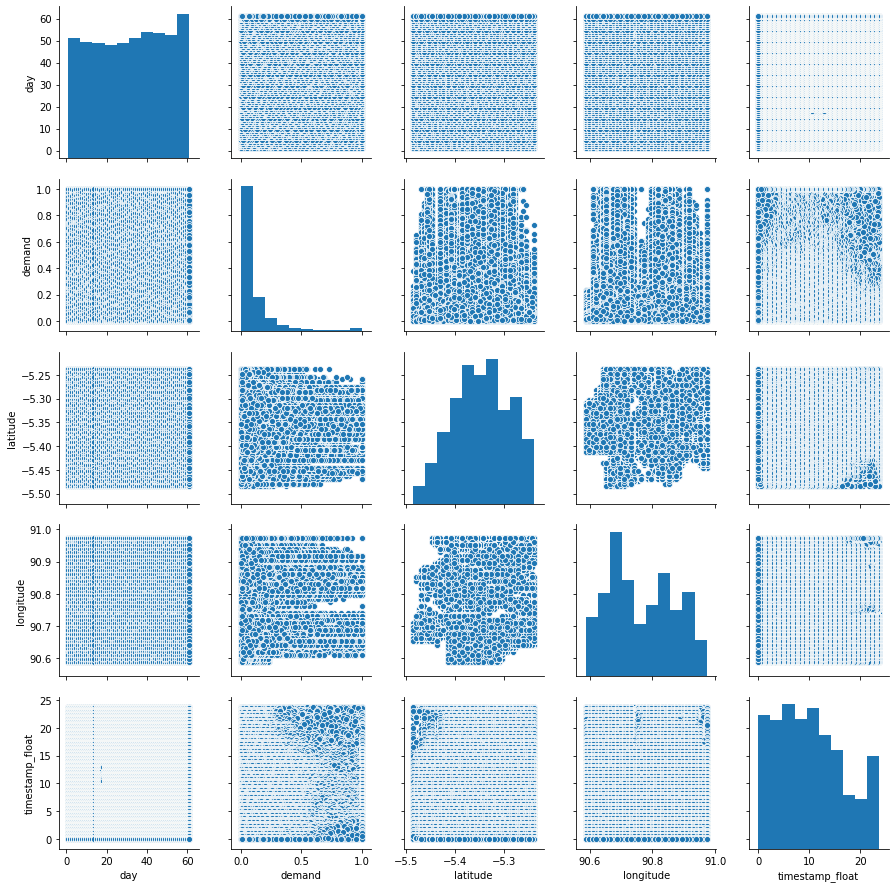

In [10]:
sns.pairplot(df);

Some things pop out in this pairplot - plot of variables against all variables including itself - (From the top):

1. For Days:
    - From (1,1): There was a sudden spike in the number of passengers taking Grab on the last days in the df - could this be an outlier?
    - From (1,2): A spectrum of demand everyday, from 0 all the way to 1. Good to know everyday is largely similar 
    - From [(1,3),(1,4)]: Every part of the geography is covered every day. Good to know everyday is largely similar 


2. For Demand:
    - From (2,2): Demand distribution follows a power law, usually it is around 0.1, and the probability of it getting any higher is quite low. We will examine this further
    - From [(2,3),(2,4)]: We can see demand may vary based on geography, with lesser demand on the outskirts of both latitude and longitude. It seems more sensitive to longitude however. We shall look more into this later on


3. For Latitude:
    - From (3,3): Latitude is centred in the middle similar to a normal distribution


4. For Longitude:
    - From (4,4): Longitude has 2 tails, meaning most rides are not from the origin of the geography when measured in longitude, but from the edges

#### Feature 1: Day data

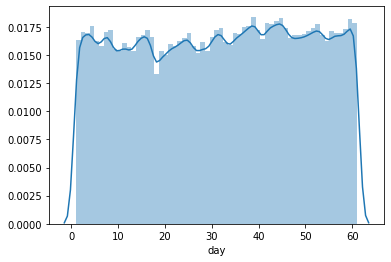

In [20]:
sns.distplot(df['day'], bins=61);

The y-axis is the total count of data rows aggregated by days, then normalised from 0-1. This gives us the proportion of bookings on any day given the total number of bookings across this 61 days.

The data does not look too skewed, which is good news. We can visualise this further in the later sections, organising the days based on weeks or days (i.e Monday, Tuesday...) to uncover more patterns

#### Feature 2: Latitude

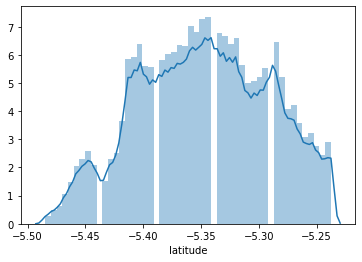

In [60]:
sns.distplot(df['latitude']);

Range of Latitude is only 0.25, but as we discovered earlier, it follows a normal distribution

#### Feature 3: Longitude

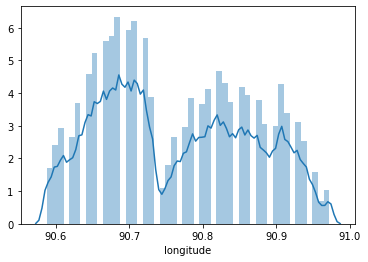

In [61]:
sns.distplot(df['longitude']);

Range of Longitude is only 0.4, but it follows a 2 peak distribution

#### Y Variable: Demand

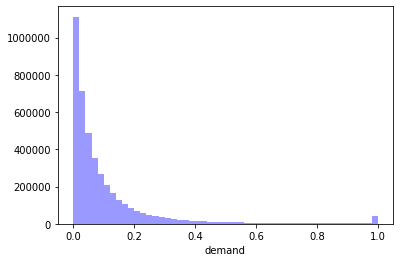

In [25]:
ax = plt.gca()
sns.distplot(df['demand'], ax=ax, kde=False, norm_hist=False, color='b')

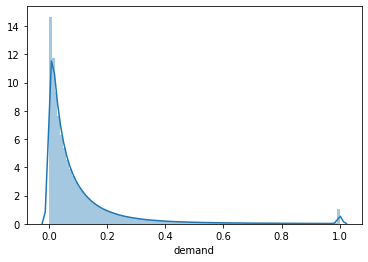

In [41]:
sns.distplot(df['demand'], bins=100, norm_hist=True);

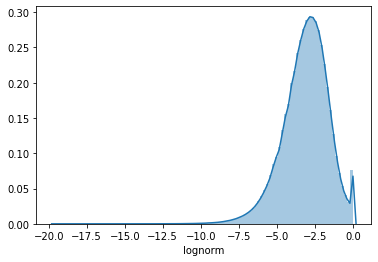

In [42]:
df['lognorm'] = np.log(df['demand'])
sns.distplot(df['lognorm'], bins=100, norm_hist=True);

We see with the lognorm that this is a fat-tailed distribution, with most of the demand being centred < 0.1, with a small bump at 1.

This prompts a question: How is demand measured?

From: https://engineering.grab.com/understanding-supply-demand-ride-hailing-data

An educated guess will be: it is the same as how Grab defines it - "It pulls together historically observed imbalances between supply and demand, for the consumer’s current location and nearby time periods." 

From: https://engineering.grab.com/peak-shift-demand-travel-trends

Therefore, there may be instances where demand is 0 when supply meets demand. Interesting.

We shall now move on to plotting trends within our dataset. For convenience, let us run with a smaller data-set for the subsequent sections. We first break them down segmented by weeks (i.e 7 day chunks).

In [9]:
df_short_week1 = df[df['day'] <= 7]
print("Week 1 df: ", df_short_week1.shape)
df_short_week2 = df[(df['day'] > 7) & (df['day'] <= 14)]
print("Week 2 df: ", df_short_week2.shape)
df_short_week3 = df[(df['day'] > 14) & (df['day'] <= 21)]
print("Week 3 df: ", df_short_week3.shape)
df_short_week4 = df[(df['day'] > 21) & (df['day'] <= 28)]
print("Week 4 df: ", df_short_week4.shape)
df_short_week5 = df[(df['day'] > 28) & (df['day'] <= 35)]
print("Week 5 df: ", df_short_week5.shape)
df_short_week6 = df[(df['day'] > 35) & (df['day'] <= 42)]
print("Week 6 df: ", df_short_week6.shape)
df_short_week7 = df[(df['day'] > 42) & (df['day'] <= 49)]
print("Week 7 df: ", df_short_week7.shape)
df_short_week8 = df[(df['day'] > 49) & (df['day'] <= 56)]
print("Week 8 df: ", df_short_week8.shape)
df_short_week9 = df[df['day'] > 56]
print("Week 9 df: ", df_short_week9.shape)

Week 1 df:  (483804, 8)
Week 2 df:  (462601, 8)
Week 3 df:  (455484, 8)
Week 4 df:  (466029, 8)
Week 5 df:  (477693, 8)
Week 6 df:  (503841, 8)
Week 7 df:  (502746, 8)
Week 8 df:  (493423, 8)
Week 9 df:  (360700, 8)


### Further EDA: 2-Feature analysis

Let us now do further EDA between 2 variables

### 1. Number of Bookings vs Days
#### Bookings across 7 days

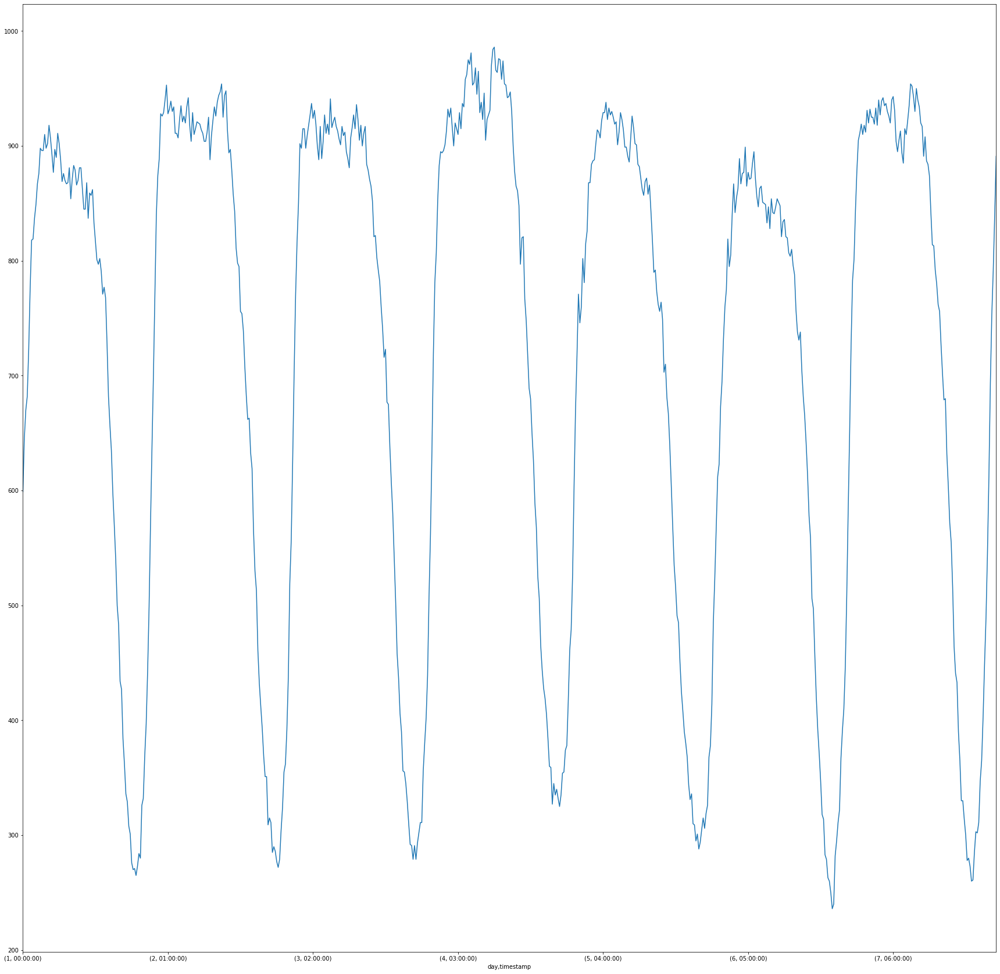

In [71]:
df_countBookings = df_short_week1.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings.plot(figsize = (30,30))

We see something very interesting: There are sharp peaks and valleys across our days, a seeming daily seasonality. For clarity, Seasonality refers to periodic fluctuations. 

Let us see if this is equally true across all days in our dataset

#### Bookings across all weeks

In [ ]:
df_countBookings = df.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings.plot(figsize = (100,100))

In [15]:
df_countBookings_w1 = df_short_week1.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w2 = df_short_week2.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w3 = df_short_week3.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w4 = df_short_week4.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w5 = df_short_week5.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w6 = df_short_week6.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w7 = df_short_week7.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w8 = df_short_week8.groupby(['day','timestamp'], as_index=True)['demand'].count()
df_countBookings_w9 = df_short_week9.groupby(['day','timestamp'], as_index=True)['demand'].count()



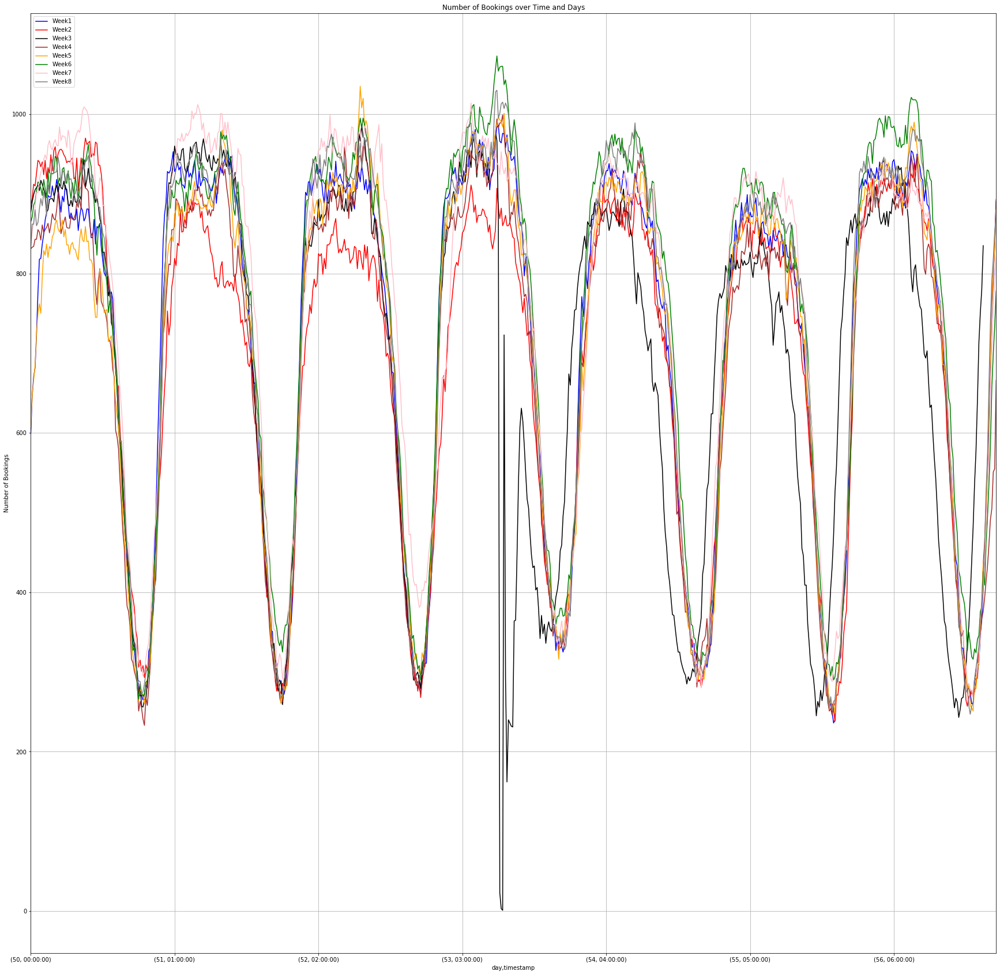

In [16]:
plt.figure(figsize=(30,30))
plt.xlabel('Day_TimeStamp')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings over Time and Days')

ax1 = df_countBookings_w1.plot(color='blue', grid=True, label='Week1')
ax2 = df_countBookings_w2.plot(color='red', grid=True, label='Week2')
ax3 = df_countBookings_w3.plot(color='black', grid=True, label='Week3')
ax4 = df_countBookings_w4.plot(color='brown', grid=True, label='Week4')
ax5 = df_countBookings_w5.plot(color='orange', grid=True, label='Week5')
ax6 = df_countBookings_w6.plot(color='green', grid=True, label='Week6')
ax7 = df_countBookings_w7.plot(color='pink', grid=True, label='Week7')
ax8 = df_countBookings_w8.plot(color='gray', grid=True, label='Week8')

# Getting the legends
h1, l1 = ax1.get_legend_handles_labels()

plt.legend(h1, l1, loc=2)
plt.show()

Indeed, this general trend is valid across all days and times. 

There are characteristics of a time-series we observe here:
Trend → a general systematic linear or (most often) nonlinear component that changes over time and does not repeat (Harder to observe)
Seasonality → a general systematic linear or (most often) nonlinear component that changes over time and does repeat (the regular peaks and valleys across days)
Noise → a non-systematic component that is nor Trend/Seasonality within the data (Week 3 is particularly off, with number of bookings reaching 0 on a certain day)

We will analyse the exact time where booking drops later on. 

Also, days seem interchangeable across weeks. We shall also analyse this later on. 

Let us now analyse bookings week by week

#### Plotting number of bookings week by week

In [17]:
df_countBookings_w1 = df_short_week1.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w2 = df_short_week2.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w3 = df_short_week3.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w4 = df_short_week4.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w5 = df_short_week5.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w6 = df_short_week6.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w7 = df_short_week7.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w8 = df_short_week8.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_w9 = df_short_week9.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])



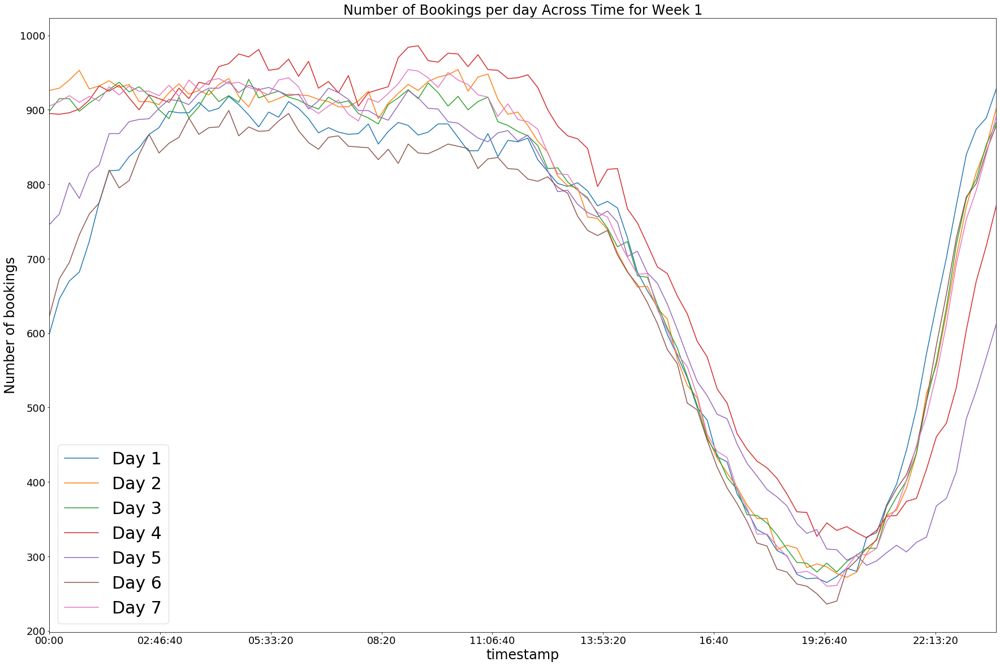

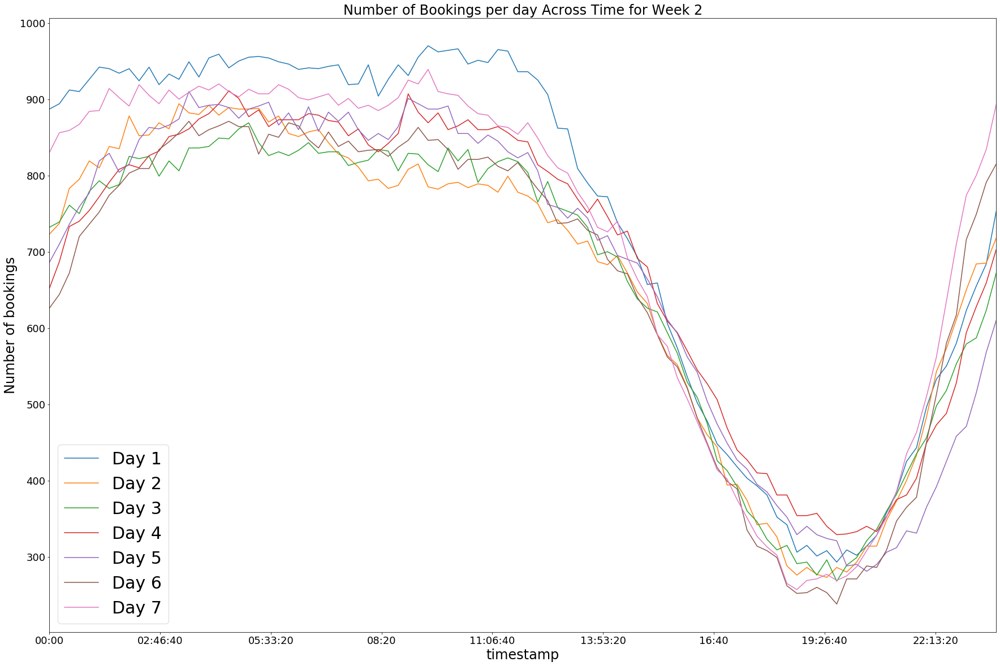

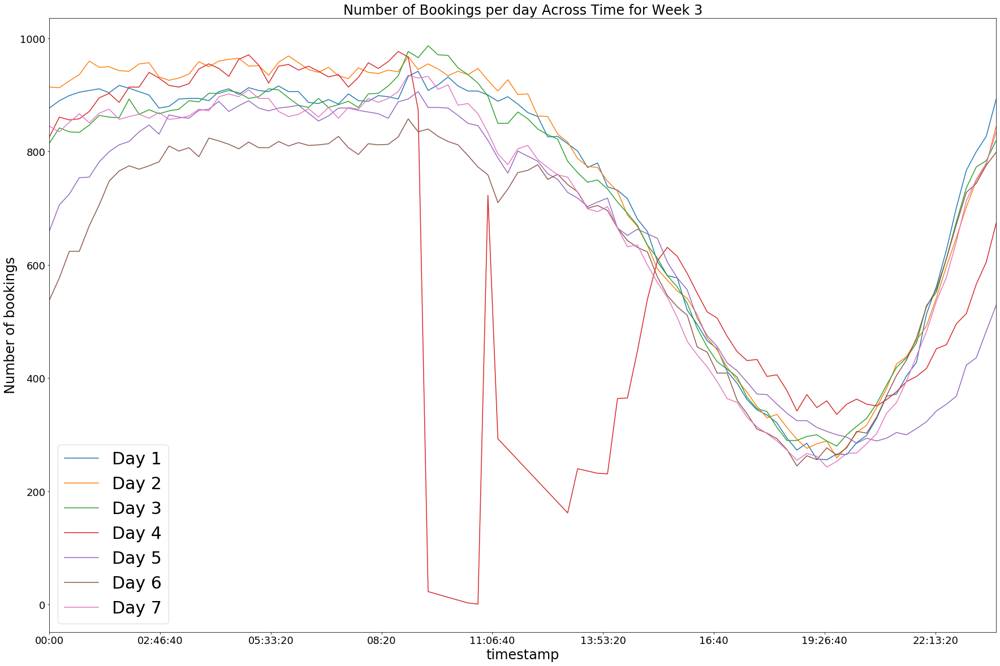

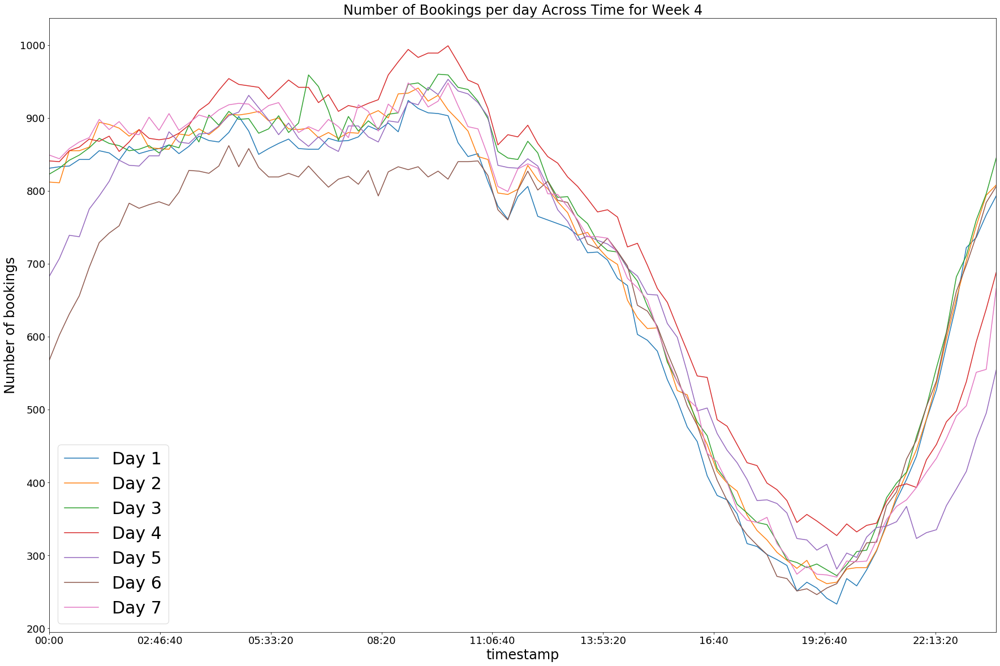

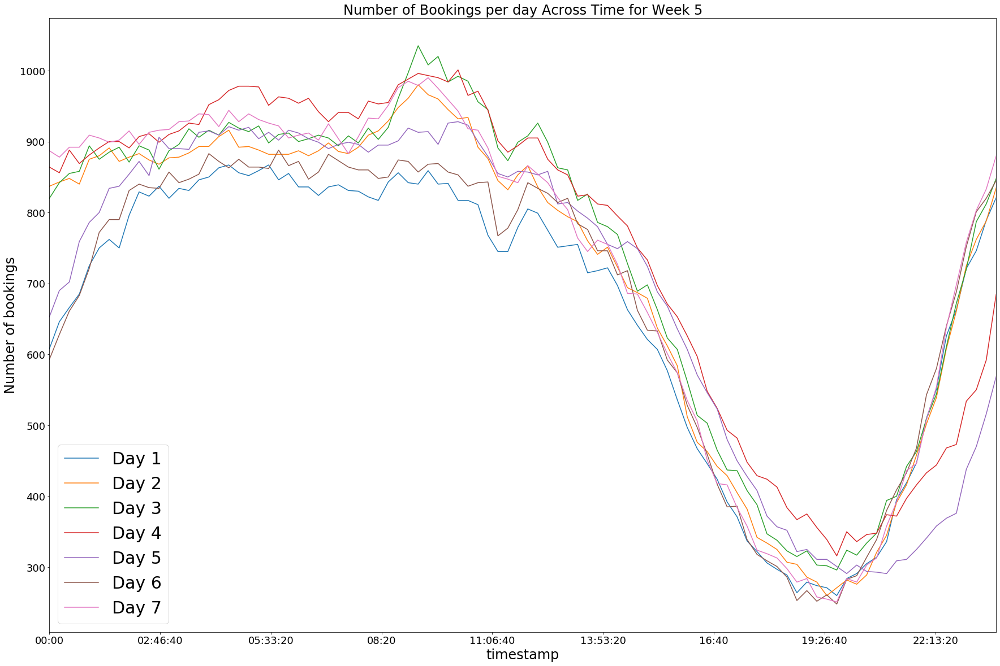

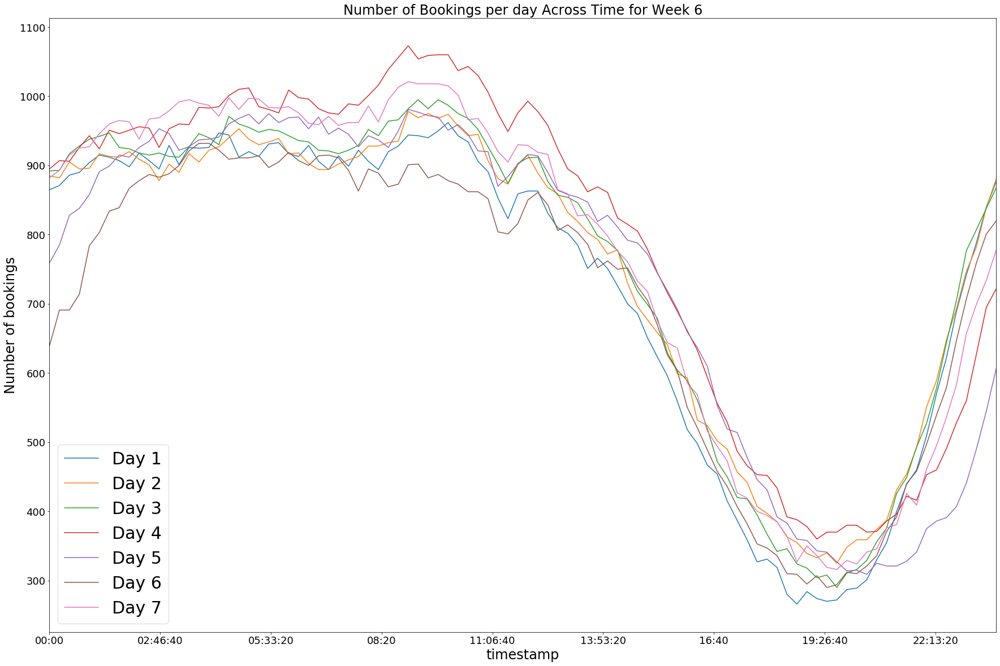

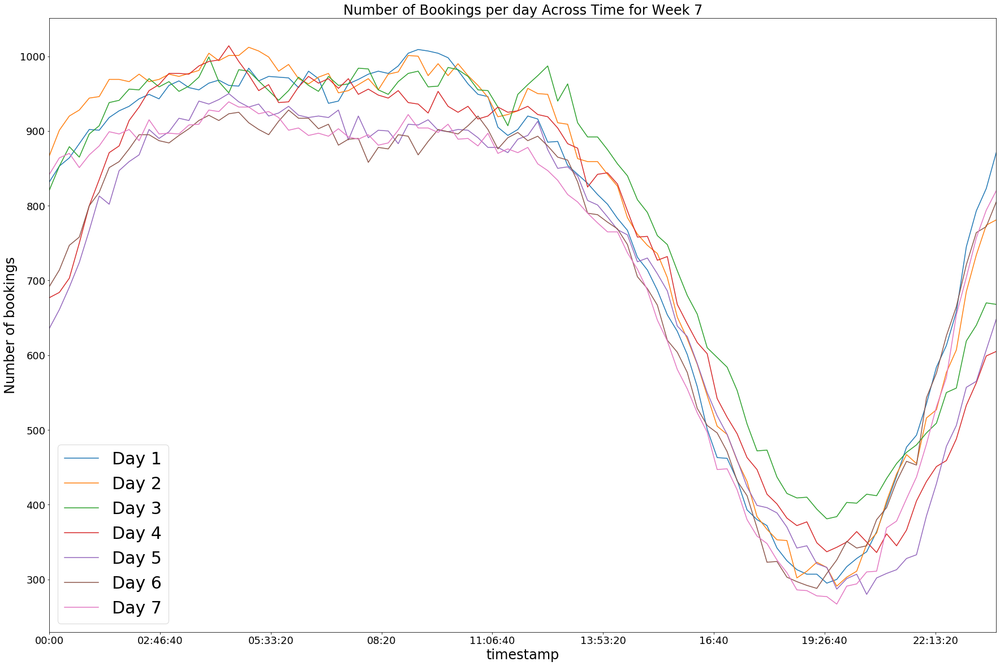

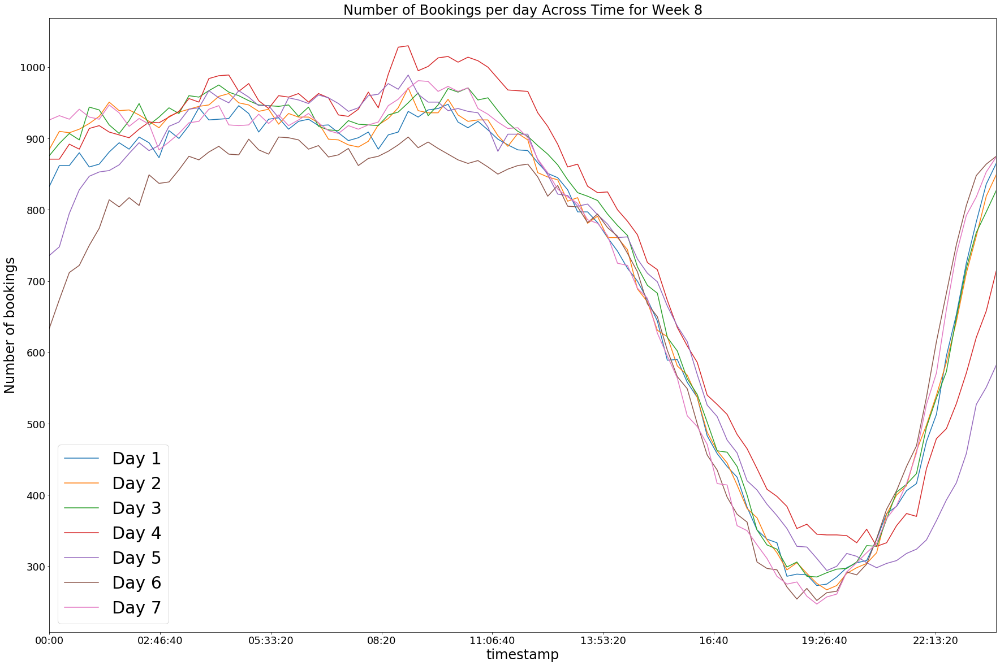

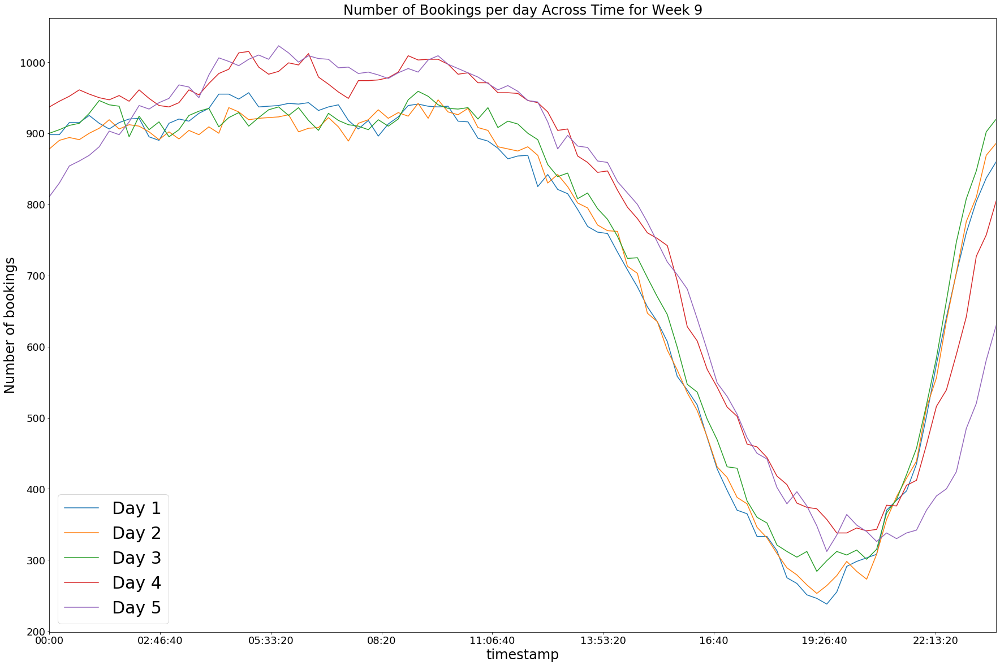

In [19]:
############### Week 1 #######################
fig, ax = plt.subplots()

ax.set_title('Number of Bookings per day Across Time for Week 1',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w1.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 2 #######################

fig2, ax2 = plt.subplots()

ax2.set_title('Number of Bookings per day Across Time for Week 2',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)


df_countBookings_w2.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax2,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax2.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 3 #######################

fig3, ax3 = plt.subplots()

ax3.set_title('Number of Bookings per day Across Time for Week 3',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w3.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax3,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax3.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 4 #######################

fig4, ax4 = plt.subplots()

ax4.set_title('Number of Bookings per day Across Time for Week 4',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w4.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax4,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax4.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 5 #######################

fig5, ax5 = plt.subplots()

ax5.set_title('Number of Bookings per day Across Time for Week 5',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w5.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax5,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax5.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 6 #######################

fig6, ax6 = plt.subplots()

ax6.set_title('Number of Bookings per day Across Time for Week 6',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w6.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax6,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax6.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 7 #######################

fig7, ax7 = plt.subplots()

ax7.set_title('Number of Bookings per day Across Time for Week 7',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w7.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax7,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax7.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 8 #######################

fig8, ax8 = plt.subplots()

ax8.set_title('Number of Bookings per day Across Time for Week 8',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w8.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax8,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax8.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 9 #######################

fig9, ax9 = plt.subplots()

ax9.set_title('Number of Bookings per day Across Time for Week 9',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_w9.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax9,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax9.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)
         
plt.show()

We see an obvious pattern across all 7 days in all weeks, with a sharp drop in the number of bookings from 12:00 to 19:30 and rising subsequently after. There's a seasonality based on time of day, a key feature of time-series data

We can hypothesise that:
1. High booking prices (proxied by demand)
2. Working time

are 2 reasons for the fall in booking numbers during this period of time.

Let us now analyse how each day is similar to each other. This is important as:  "One of the key insights is that the surge trends during peak hour is different on Monday from Tuesday."

From: https://engineering.grab.com/peak-shift-demand-travel-trends

#### Plotting number of bookings within specific days e.g. Mondays, Tuesdays ... How similar are these days?

In [10]:
df_short_Day1 = df[(df['day'] == 1) | (df['day'] == 8) | (df['day'] == 15) | (df['day'] == 22) | (df['day'] == 29) | (df['day'] == 36) | (df['day'] == 43) | (df['day'] == 50) | (df['day'] == 57)]
df_short_Day2 = df[(df['day'] == 2) | (df['day'] == 9) | (df['day'] == 16) | (df['day'] == 23) | (df['day'] == 30) | (df['day'] == 37) | (df['day'] == 44) | (df['day'] == 51) | (df['day'] == 58)]
df_short_Day3 = df[(df['day'] == 3) | (df['day'] == 10) | (df['day'] == 17) | (df['day'] == 24) | (df['day'] == 31) | (df['day'] == 38) | (df['day'] == 45) | (df['day'] == 52) | (df['day'] == 59)]
df_short_Day4 = df[(df['day'] == 4) | (df['day'] == 11) | (df['day'] == 18) | (df['day'] == 25) | (df['day'] == 32) | (df['day'] == 39) | (df['day'] == 46) | (df['day'] == 53) | (df['day'] == 60)]
df_short_Day5 = df[(df['day'] == 5) | (df['day'] == 12) | (df['day'] == 19) | (df['day'] == 26) | (df['day'] == 33) | (df['day'] == 40) | (df['day'] == 47) | (df['day'] == 54) | (df['day'] == 61)]
df_short_Day6 = df[(df['day'] == 6) | (df['day'] == 13) | (df['day'] == 20) | (df['day'] == 27) | (df['day'] == 34) | (df['day'] == 41) | (df['day'] == 48) | (df['day'] == 55) | (df['day'] == 62)]
df_short_Day7 = df[(df['day'] == 7) | (df['day'] == 14) | (df['day'] == 21) | (df['day'] == 28) | (df['day'] == 35) | (df['day'] == 42) | (df['day'] == 49) | (df['day'] == 56) | (df['day'] == 63)]

print("Day 1 df: ", df_short_Day1.shape)
print("Day 2 df: ", df_short_Day2.shape)
print("Day 3 df: ", df_short_Day3.shape)
print("Day 4 df: ", df_short_Day4.shape)
print("Day 5 df: ", df_short_Day5.shape)
print("Day 6 df: ", df_short_Day6.shape)
print("Day 7 df: ", df_short_Day7.shape)

Day 1 df:  (620418, 9)
Day 2 df:  (629281, 9)
Day 3 df:  (565256, 9)
Day 4 df:  (632786, 9)
Day 5 df:  (610482, 9)
Day 6 df:  (524054, 9)
Day 7 df:  (555733, 9)


In [11]:
df_countBookings_d1 = df_short_Day1.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d2 = df_short_Day2.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d3 = df_short_Day3.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d4 = df_short_Day4.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d5 = df_short_Day5.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d6 = df_short_Day6.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])
df_countBookings_d7 = df_short_Day7.groupby(['day','timestamp'], as_index=False)['demand'].count().sort_values(['day','timestamp'], ascending=[1,1])

df_countBookings_pivot_d1 = df_countBookings_d1.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d2 = df_countBookings_d2.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d3 = df_countBookings_d3.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d4 = df_countBookings_d4.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d5 = df_countBookings_d5.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d6 = df_countBookings_d6.pivot(index='timestamp', columns='day', values='demand')
df_countBookings_pivot_d7 = df_countBookings_d7.pivot(index='timestamp', columns='day', values='demand')



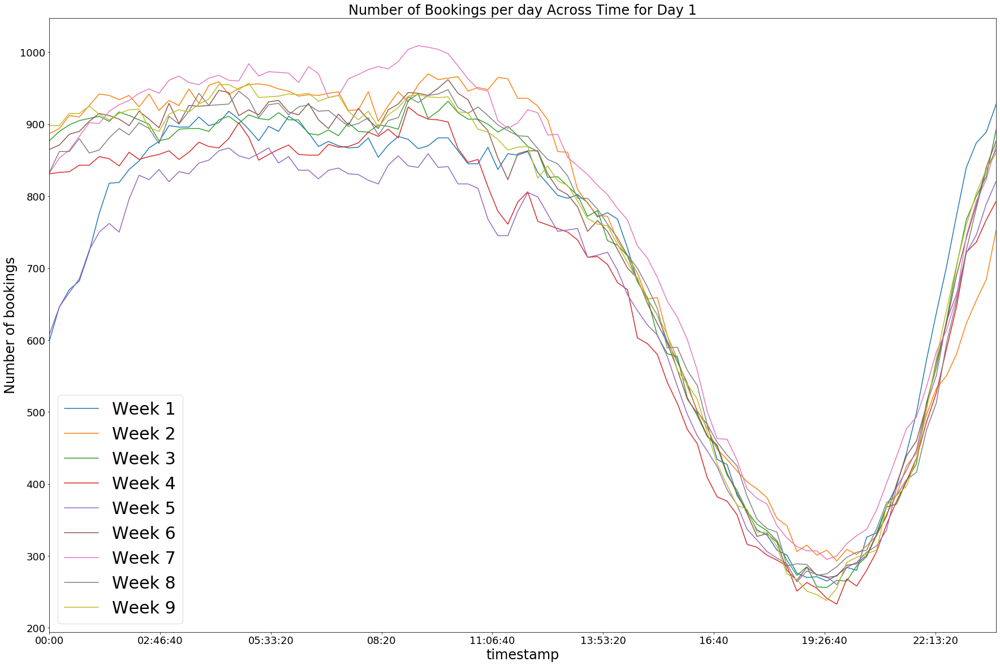

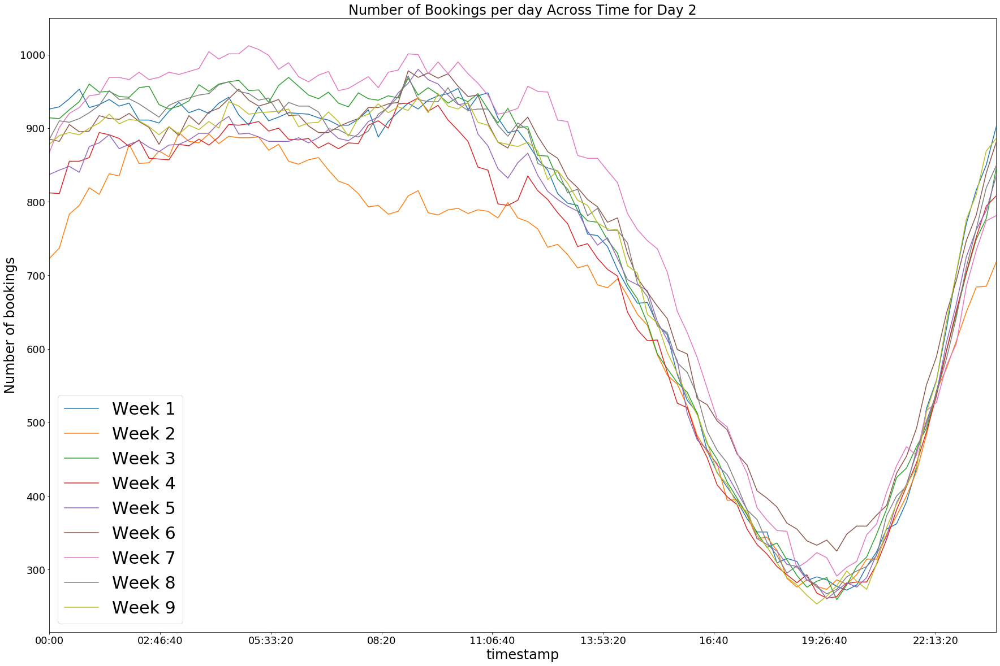

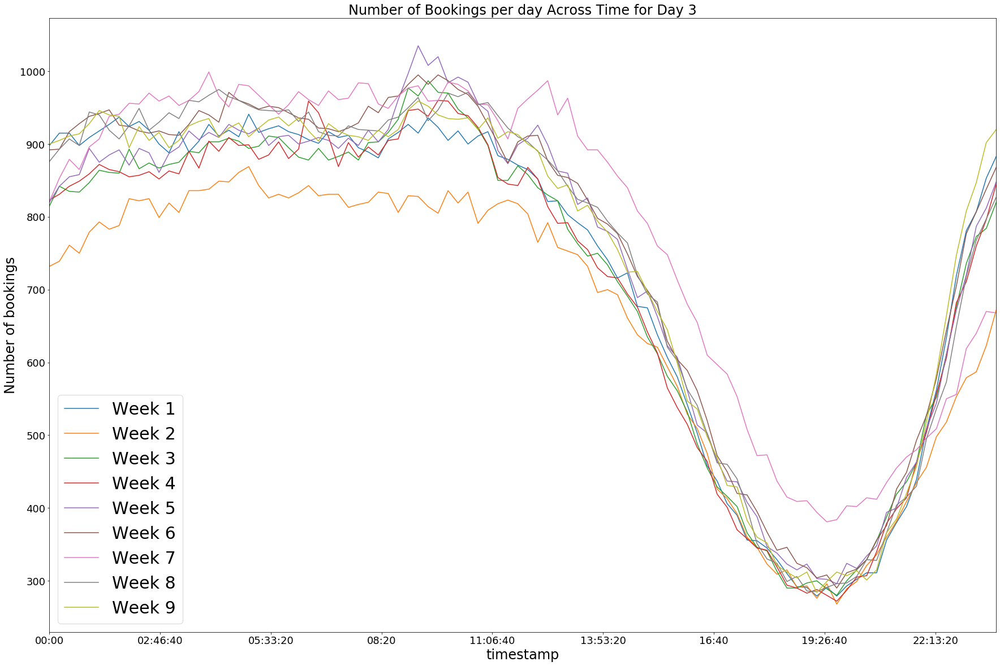

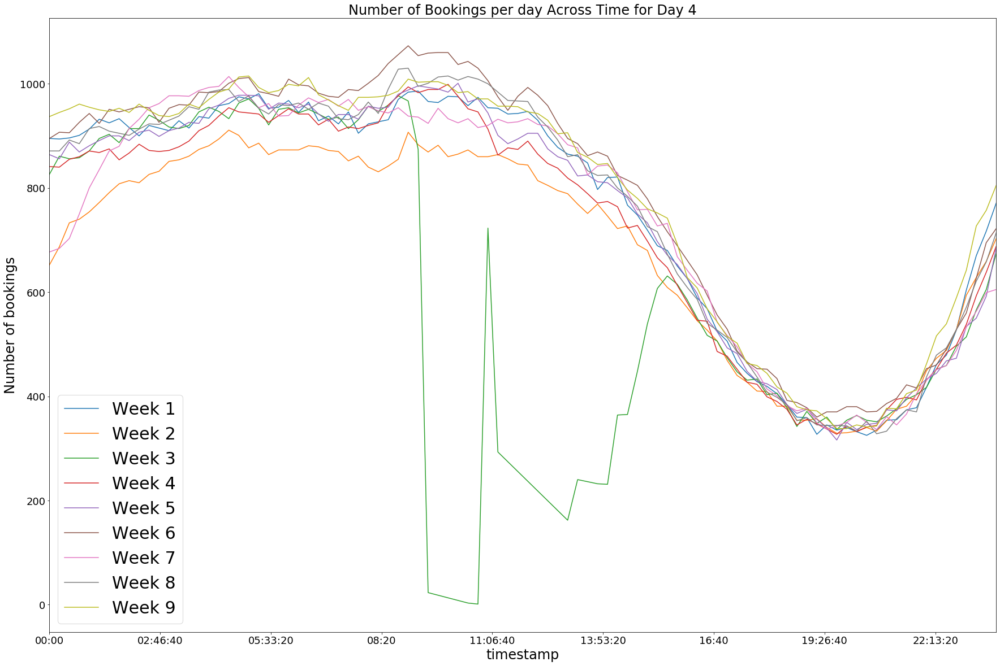

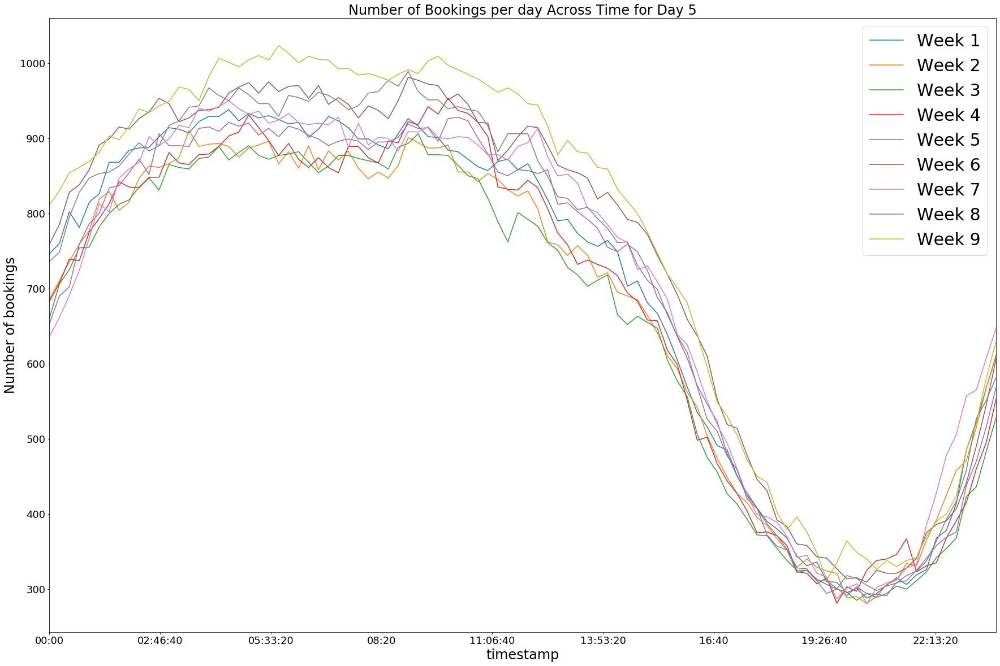

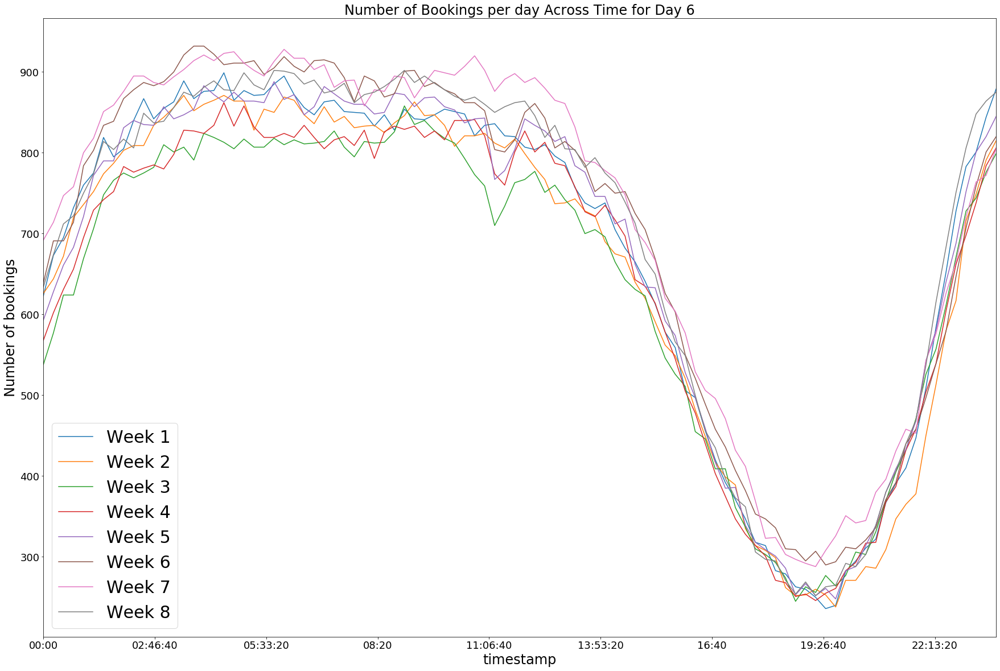

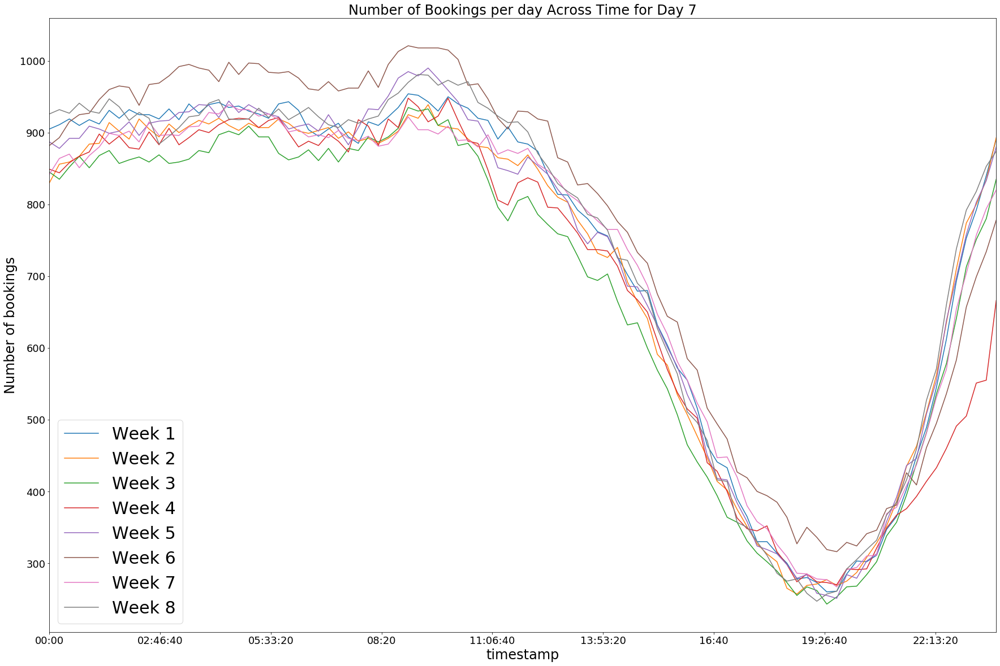

In [22]:
############### Day 1 #######################
fig, ax = plt.subplots()

ax.set_title('Number of Bookings per day Across Time for Day 1',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d1.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 2 #######################

fig2, ax2 = plt.subplots()

ax2.set_title('Number of Bookings per day Across Time for Day 2',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)


df_countBookings_d2.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax2,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax2.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 3 #######################

fig3, ax3 = plt.subplots()

ax3.set_title('Number of Bookings per day Across Time for Day 3',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d3.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax3,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax3.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 4 #######################

fig4, ax4 = plt.subplots()

ax4.set_title('Number of Bookings per day Across Time for Day 4',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d4.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax4,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax4.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 5 #######################

fig5, ax5 = plt.subplots()

ax5.set_title('Number of Bookings per day Across Time for Day 5',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d5.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax5,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax5.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 6 #######################

fig6, ax6 = plt.subplots()

ax6.set_title('Number of Bookings per day Across Time for Day 6',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d6.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax6,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax6.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 7 #######################

fig7, ax7 = plt.subplots()

ax7.set_title('Number of Bookings per day Across Time for Day 7',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Number of bookings", fontsize=24)

df_countBookings_d7.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax7,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax7.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)


plt.show()

__Insights:__

Not sure how each day can be considered similar, despite the Grab driver's contextual claim.

Let us drop Week 3 Day 4 which is an obvious outlier (in timestamps: 830 to 1645) and see how things change.

In [10]:
# drop 
df = df[df.day != 24]
df.tail()

,geohash6,day,timestamp,demand,coordinates,latitude,longitude,Coordinates_point,timestamp_float
4186274,qp03wj,61,00:00:00,0.066077,"(-5.33111572265625, 90.6207275390625)",-5.331116,90.620728,POINT (90.6207275390625 -5.33111572265625),0.0
4186801,qp0d49,61,00:00:00,0.012398,"(-5.26519775390625, 90.8184814453125)",-5.265198,90.818481,POINT (90.8184814453125 -5.26519775390625),0.0
4186920,qp09s3,61,00:00:00,0.001617,"(-5.35308837890625, 90.8953857421875)",-5.353088,90.895386,POINT (90.8953857421875 -5.35308837890625),0.0
4193503,qp09bw,61,00:00:00,0.006918,"(-5.28167724609375, 90.7305908203125)",-5.281677,90.730591,POINT (90.7305908203125 -5.28167724609375),0.0
4204314,qp03w8,61,00:00:00,0.184475,"(-5.35858154296875, 90.6427001953125)",-5.358582,90.642700,POINT (90.6427001953125 -5.35858154296875),0.0


In [11]:
df.to_csv(r'data/processed_data.csv', index=False)

In [13]:
df.shape

(4138010, 9)

#### Plotting number of bookings across specific days e.g. Mondays, Tuesdays ... How different are these days on average?

In [12]:
df_countBookings_d1 = df_short_Day1.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d2 = df_short_Day2.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d3 = df_short_Day3.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d4 = df_short_Day4.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d5 = df_short_Day5.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d6 = df_short_Day6.groupby(['timestamp'], as_index=True)['demand'].count()
df_countBookings_d7 = df_short_Day7.groupby(['timestamp'], as_index=True)['demand'].count()



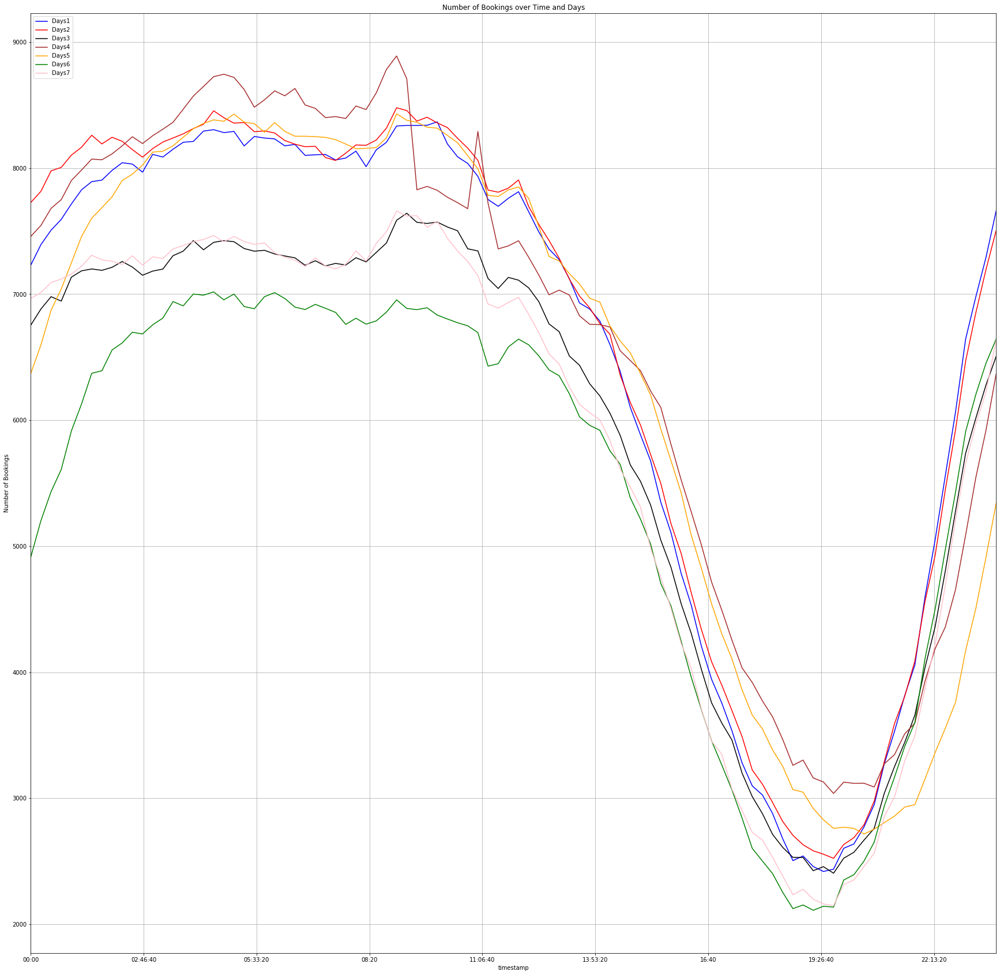

In [13]:
plt.figure(figsize=(30,30))
plt.xlabel('Day_TimeStamp')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings over Time and Days')

ax1 = df_countBookings_d1.plot(color='blue', grid=True, label='Days1')
ax2 = df_countBookings_d2.plot(color='red', grid=True, label='Days2')
ax3 = df_countBookings_d3.plot(color='black', grid=True, label='Days3')
ax4 = df_countBookings_d4.plot(color='brown', grid=True, label='Days4')
ax5 = df_countBookings_d5.plot(color='orange', grid=True, label='Days5')
ax6 = df_countBookings_d6.plot(color='green', grid=True, label='Days6')
ax7 = df_countBookings_d7.plot(color='pink', grid=True, label='Days7')

# Getting the legends
h1, l1 = ax1.get_legend_handles_labels()

plt.legend(h1, l1, loc=2)
plt.show()

There appears to be a disparity in the total number of bookings depending on which day it is e.g. Days 6 and 7 tend to be lower peaks and valleys in general. I would guess these are Saturdays and Sundays, as the prices tend to be more expensive???

That however may be an unrepresentative picture. Let us use the median instead

In [14]:
df_countBookings_d1_median = df_short_Day1.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d2_median = df_short_Day2.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d3_median = df_short_Day3.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d4_median = df_short_Day4.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d5_median = df_short_Day5.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d6_median = df_short_Day6.groupby(['timestamp'], as_index=True)['demand'].median()
df_countBookings_d7_median = df_short_Day7.groupby(['timestamp'], as_index=True)['demand'].median()

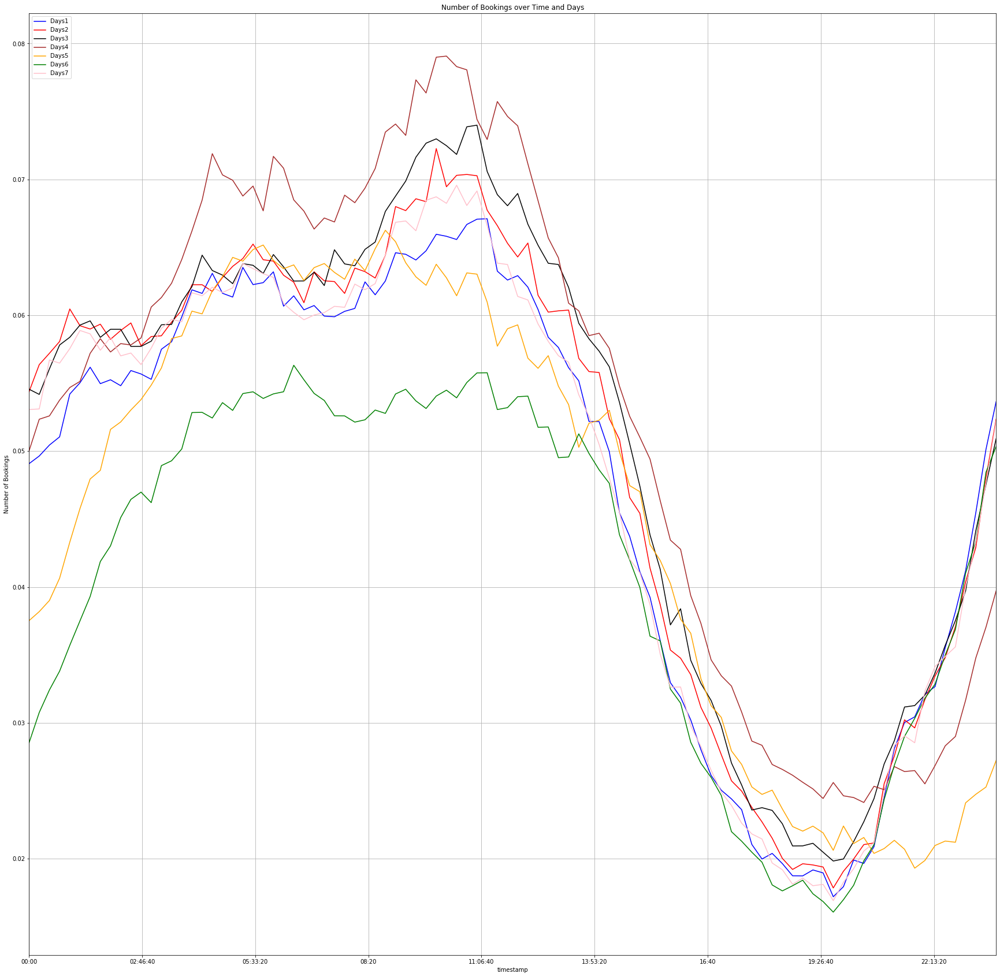

In [15]:
plt.figure(figsize=(30,30))
plt.xlabel('Day_TimeStamp')
plt.ylabel('Number of Bookings')
plt.title('Number of Bookings over Time and Days')

ax1 = df_countBookings_d1_median.plot(color='blue', grid=True, label='Days1')
ax2 = df_countBookings_d2_median.plot(color='red', grid=True, label='Days2')
ax3 = df_countBookings_d3_median.plot(color='black', grid=True, label='Days3')
ax4 = df_countBookings_d4_median.plot(color='brown', grid=True, label='Days4')
ax5 = df_countBookings_d5_median.plot(color='orange', grid=True, label='Days5')
ax6 = df_countBookings_d6_median.plot(color='green', grid=True, label='Days6')
ax7 = df_countBookings_d7_median.plot(color='pink', grid=True, label='Days7')

# Getting the legends
h1, l1 = ax1.get_legend_handles_labels()

plt.legend(h1, l1, loc=2)
plt.show()

Indeed, using the median gives us a different picture that indeed, different days of the week have different demand levels

### Plotting demand and time
#### Plotting demand within specific days e.g. Mondays, Tuesdays ... How similar are these days?

In [177]:
df_demand_d1 = df_short_Day1.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d2 = df_short_Day2.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d3 = df_short_Day3.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d4 = df_short_Day4.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d5 = df_short_Day5.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d6 = df_short_Day6.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_d7 = df_short_Day7.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])

df_demand_d7.tail(20)


,day,timestamp,demand
748,56,19:00:00,0.041388
749,56,19:15:00,0.039996
750,56,19:30:00,0.035468
751,56,19:45:00,0.034745
752,56,20:00:00,0.039634
753,56,20:15:00,0.036799
754,56,20:30:00,0.037944
755,56,20:45:00,0.040276
756,56,21:00:00,0.048249
757,56,21:15:00,0.052950


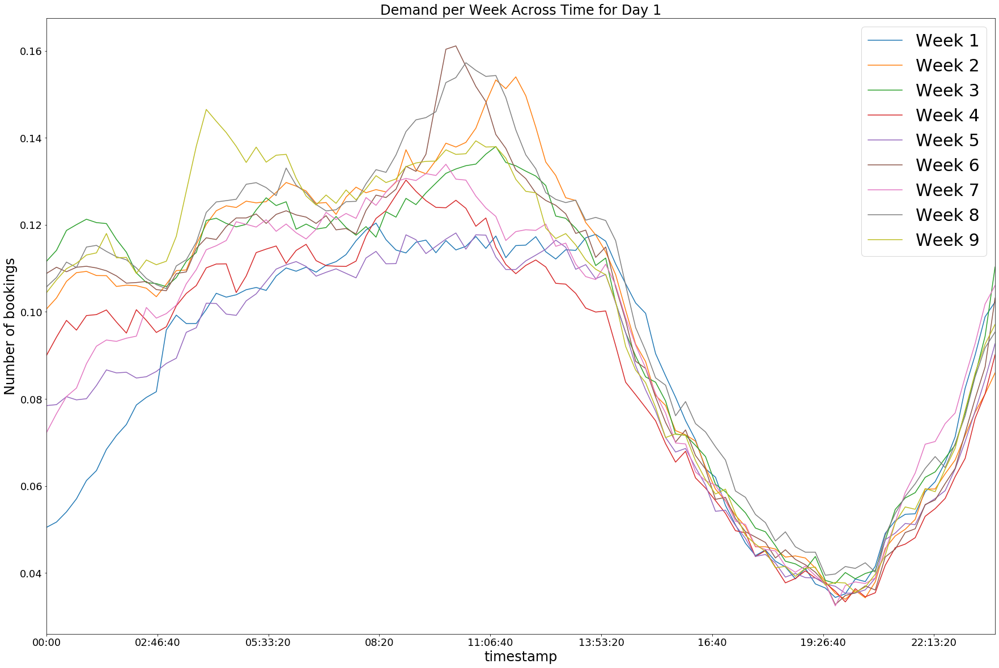

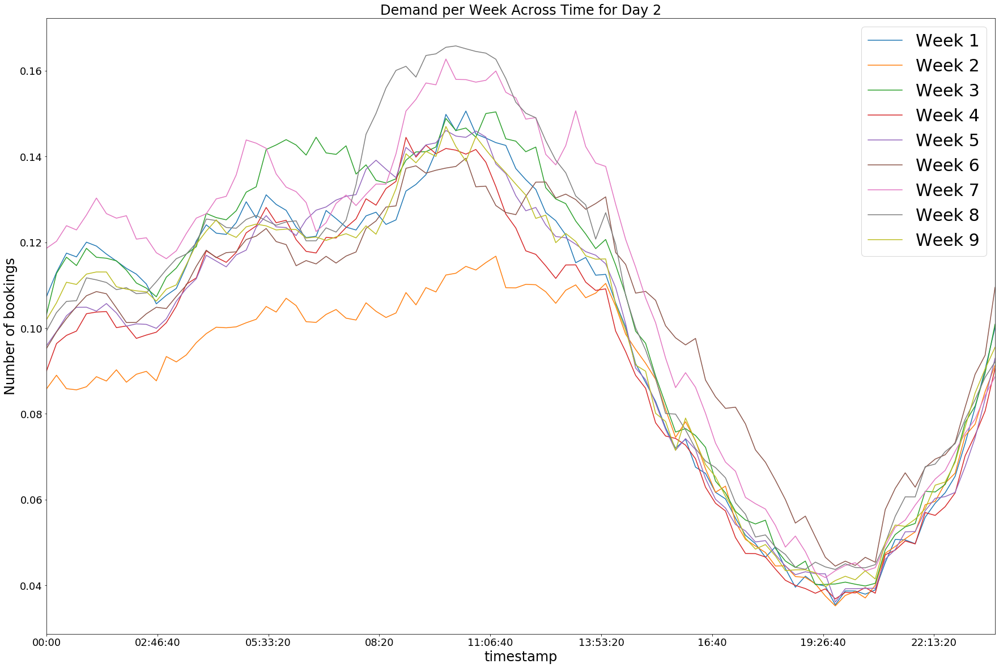

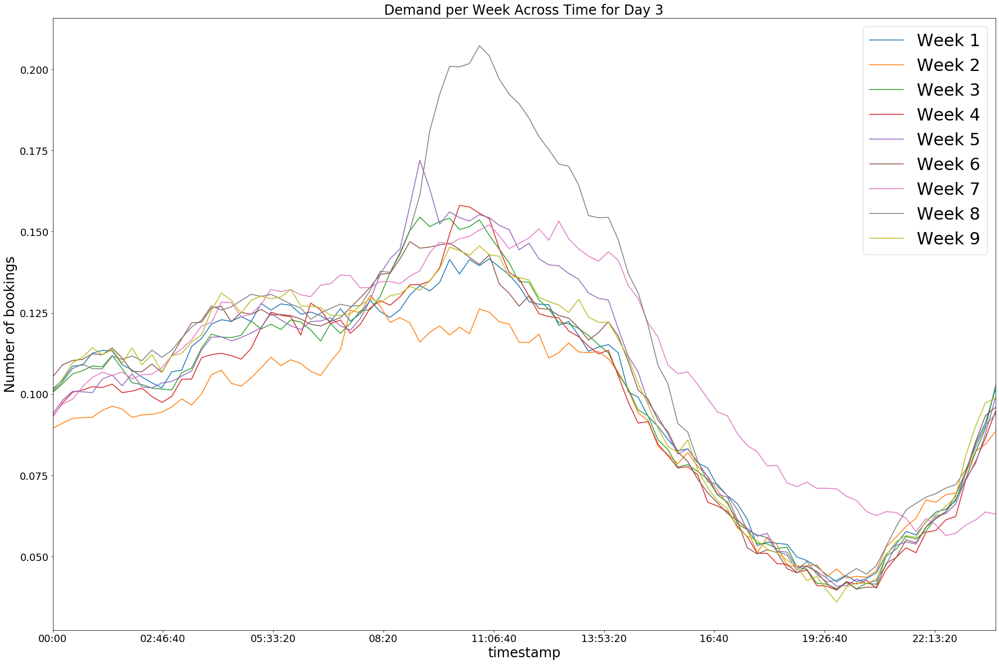

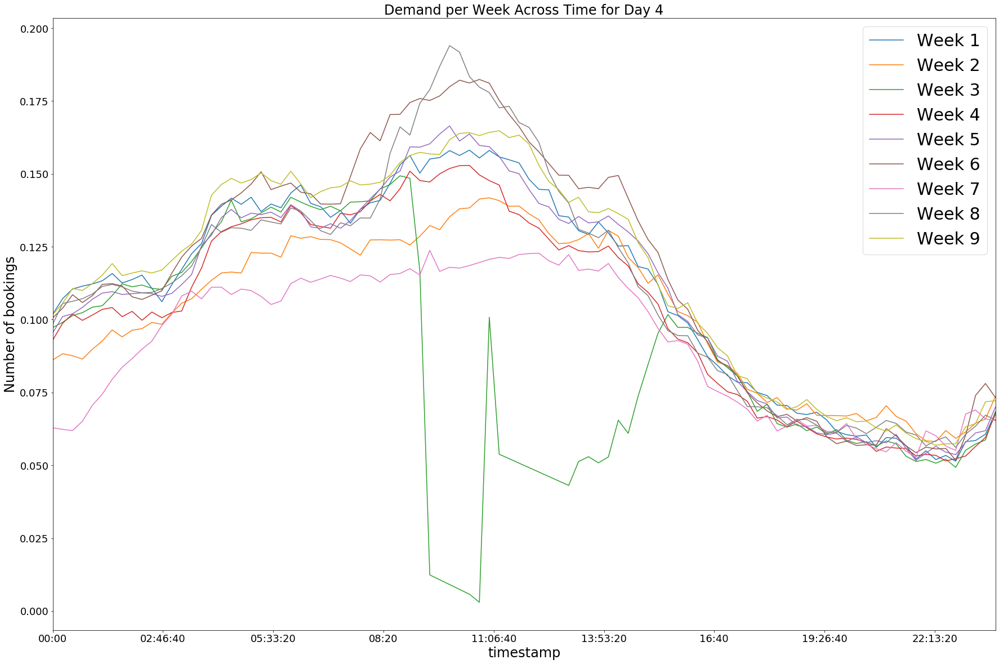

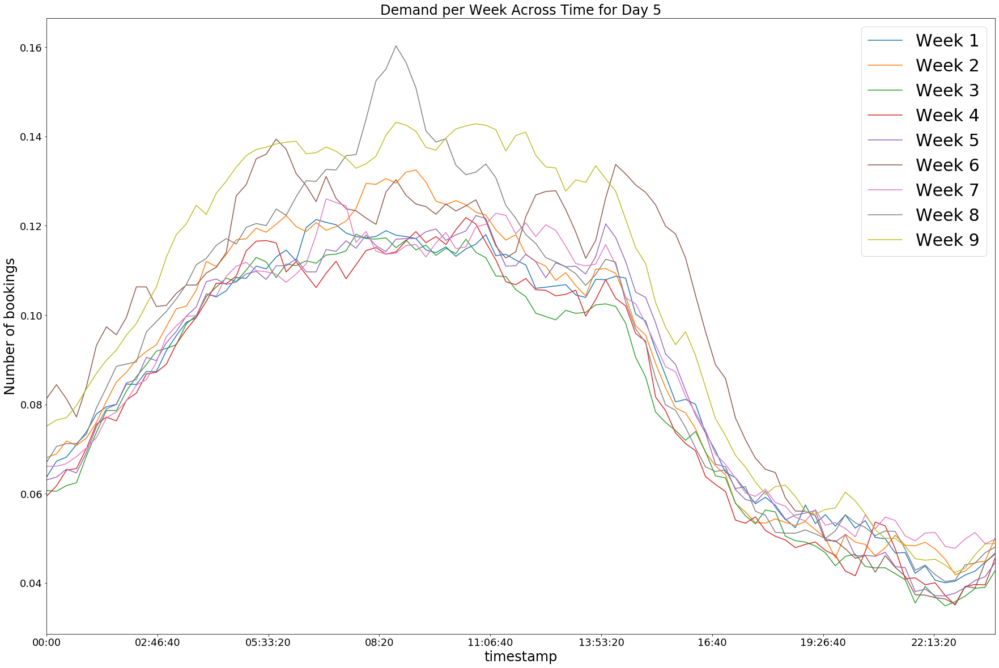

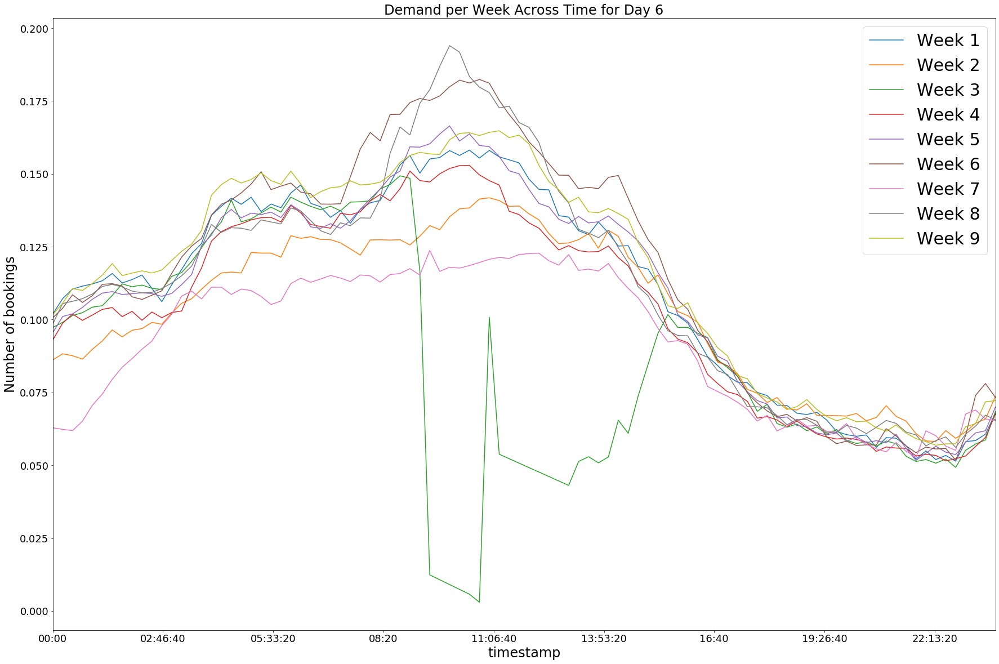

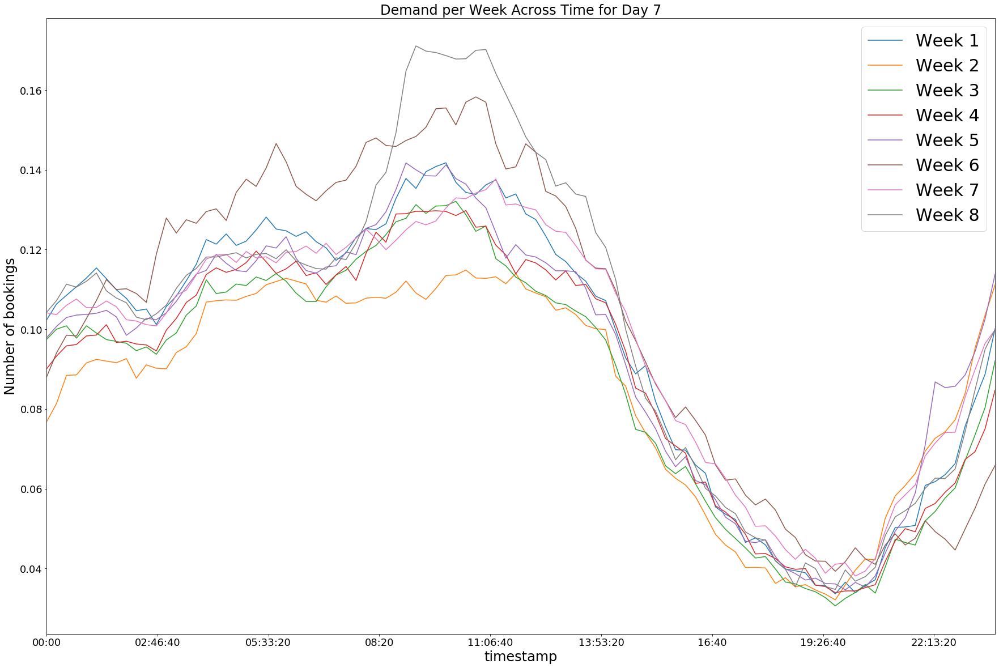

In [176]:
############### Day 1 #######################
fig, ax = plt.subplots()

ax.set_title('Demand per Week Across Time for Day 1',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d1.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 2 #######################
fig2, ax2 = plt.subplots()

ax2.set_title('Demand per Week Across Time for Day 2',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d2.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax2,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax2.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 3 #######################
fig3, ax3 = plt.subplots()

ax3.set_title('Demand per Week Across Time for Day 3',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d3.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax3,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax3.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 4 #######################
fig4, ax4 = plt.subplots()

ax4.set_title('Demand per Week Across Time for Day 4',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d4.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax4,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax4.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 5 #######################
fig5, ax5 = plt.subplots()

ax5.set_title('Demand per Week Across Time for Day 5',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d5.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax5,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax5.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 6 #######################
fig6, ax6 = plt.subplots()

ax6.set_title('Demand per Week Across Time for Day 6',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d6.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax6,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax6.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)

############### Day 7 #######################
fig7, ax7 = plt.subplots()

ax7.set_title('Demand per Week Across Time for Day 7',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_d7.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax7,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax7.legend(["Week 1", "Week 2", "Week 3", "Week 4", "Week 5", "Week 6", "Week 7", "Week 8", "Week 9"], fontsize=30)



It's not immediately clear how demand varies across weeks. 

We do have data stationarity, meaning there's no trend that will not appear only in the test set but not in the train set

#### Plotting number of bookings across specific days e.g. Mondays, Tuesdays ... How different are these days on average?

In [178]:
df_demand_w1 = df_short_week1.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w2 = df_short_week2.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w3 = df_short_week3.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w4 = df_short_week4.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w5 = df_short_week5.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w6 = df_short_week6.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w7 = df_short_week7.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w8 = df_short_week8.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])
df_demand_w9 = df_short_week9.groupby(['day','timestamp'], as_index=False)['demand'].mean().sort_values(['day','timestamp'], ascending=[1,1])



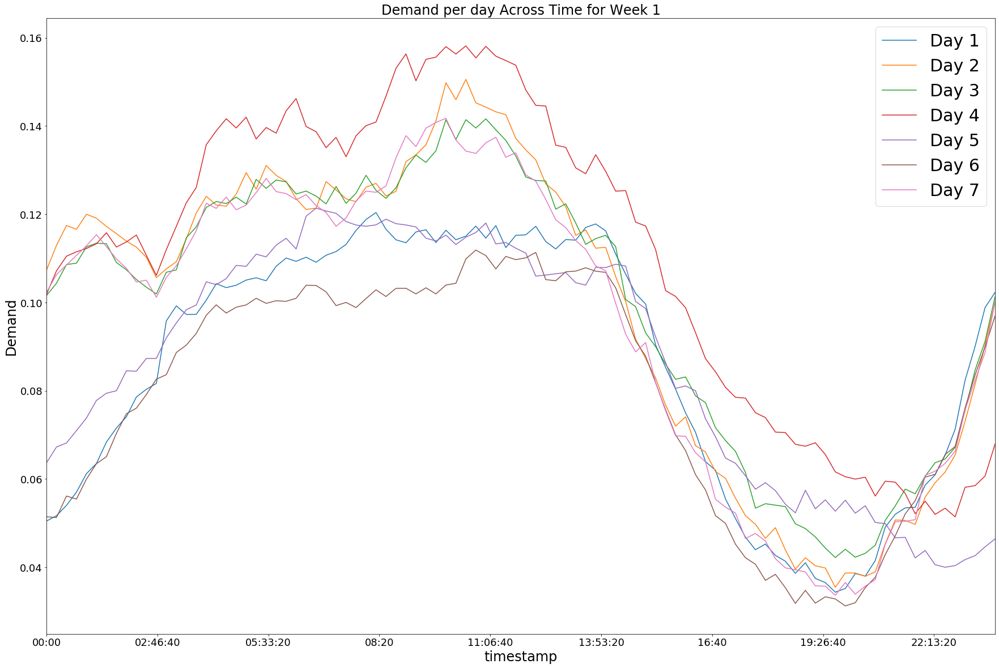

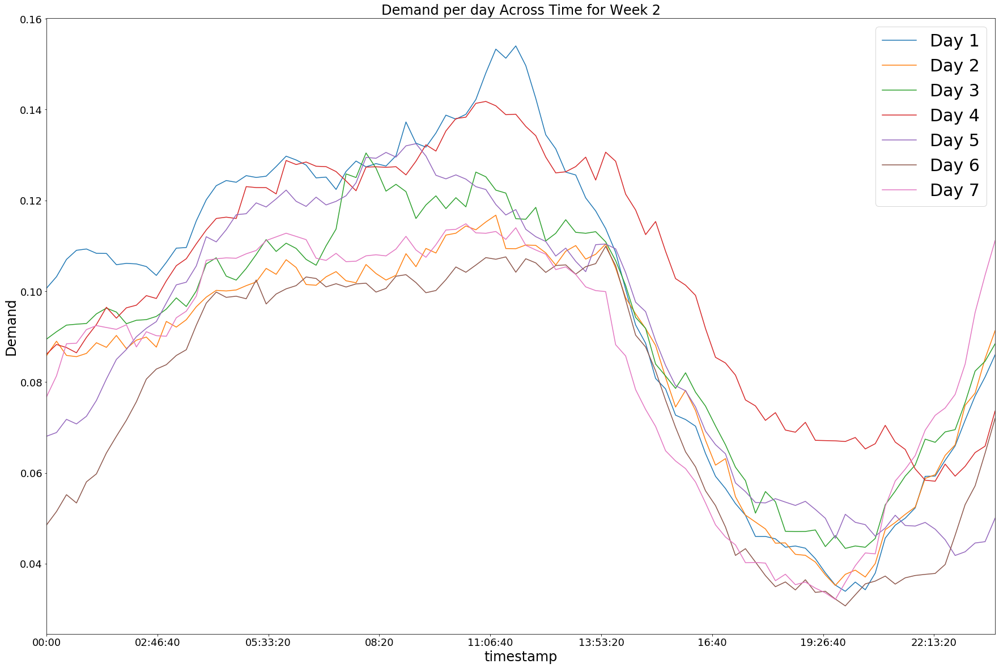

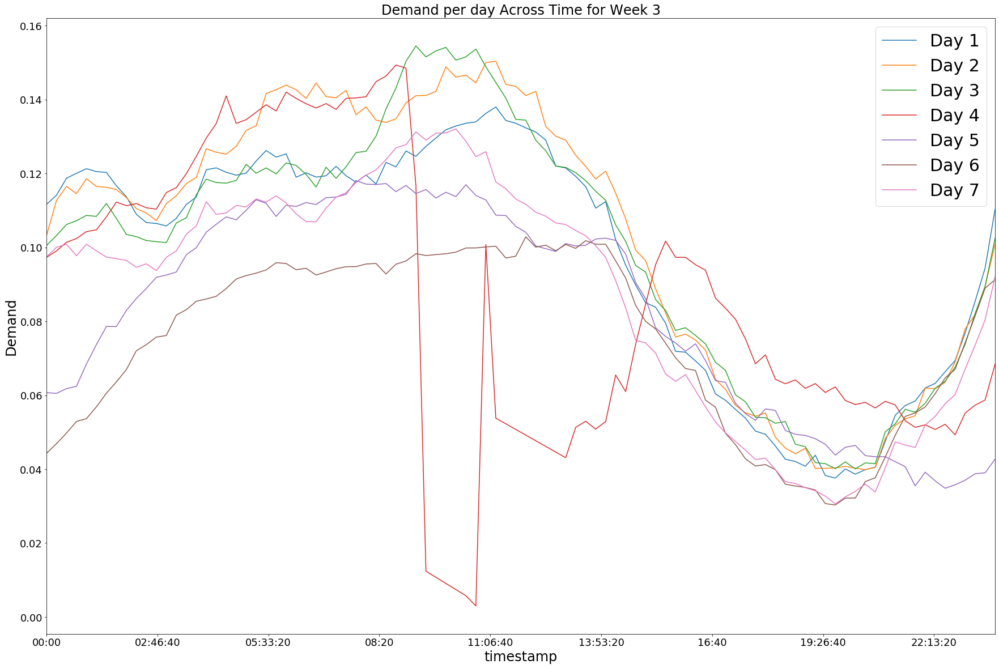

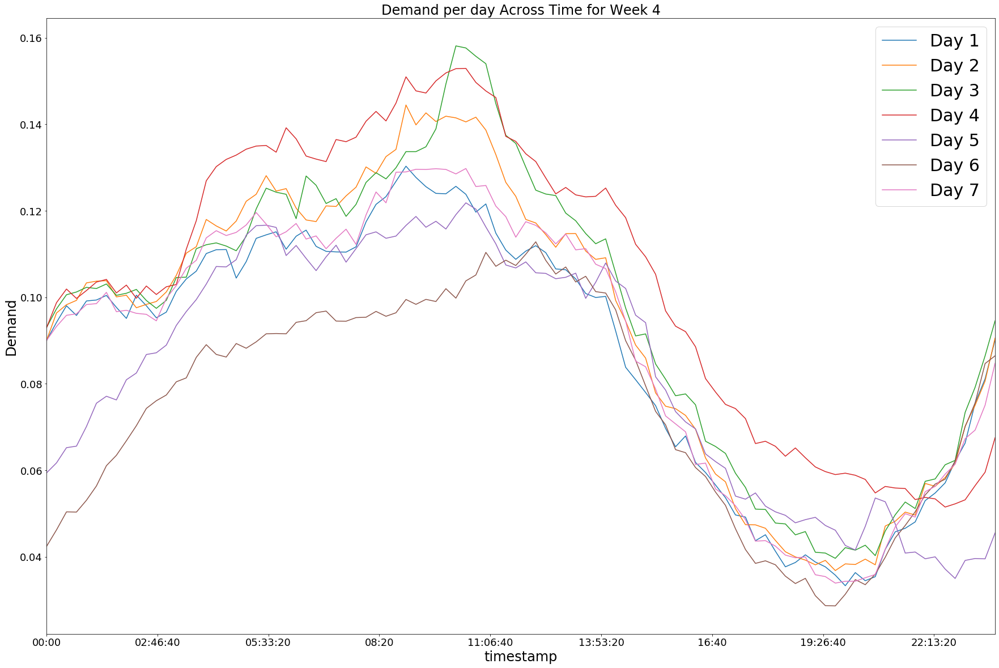

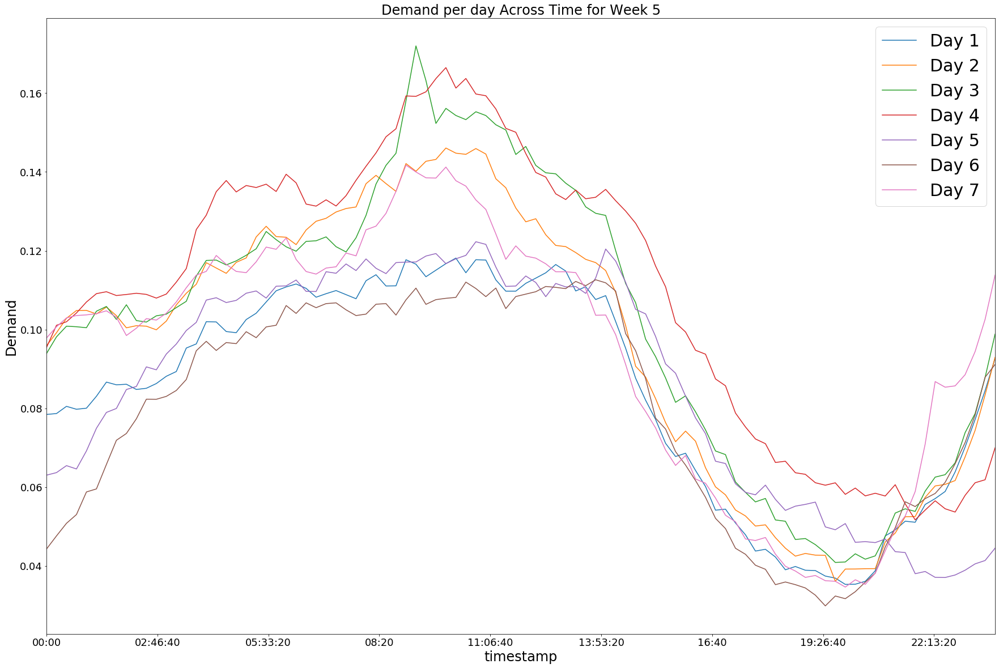

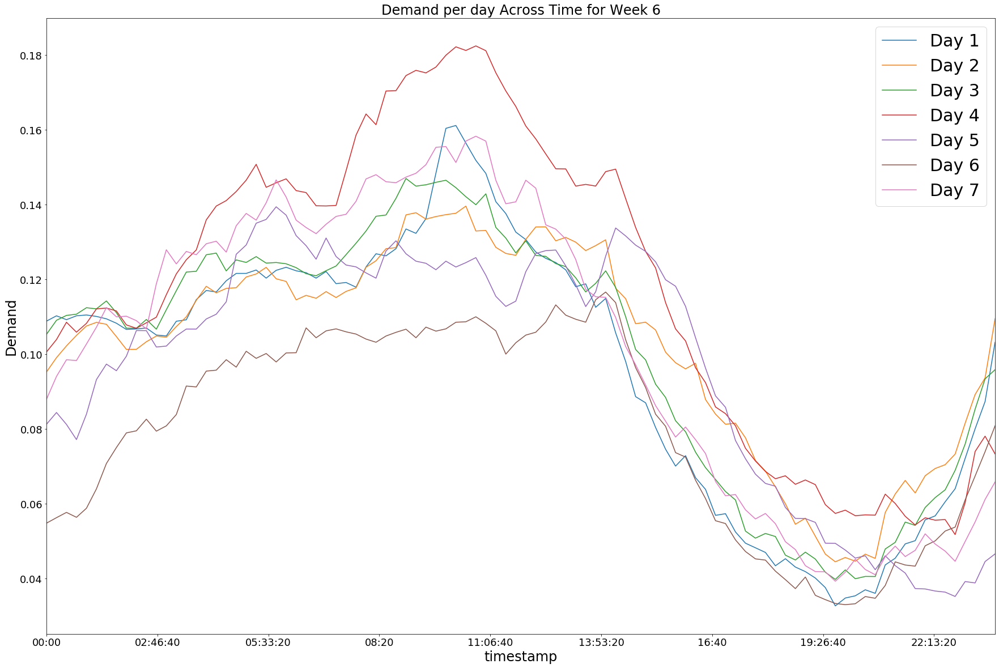

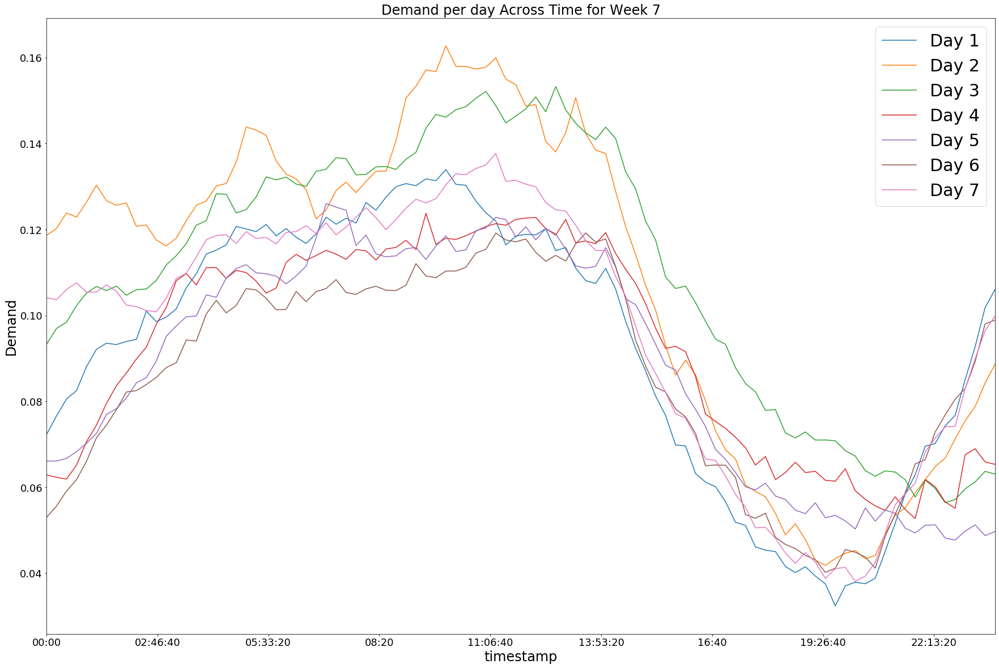

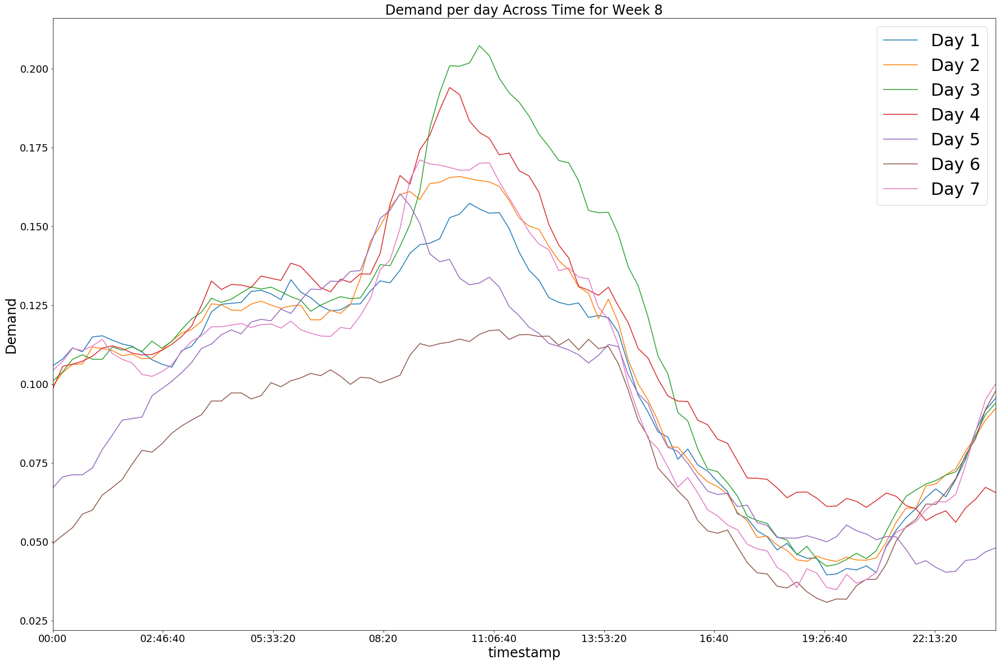

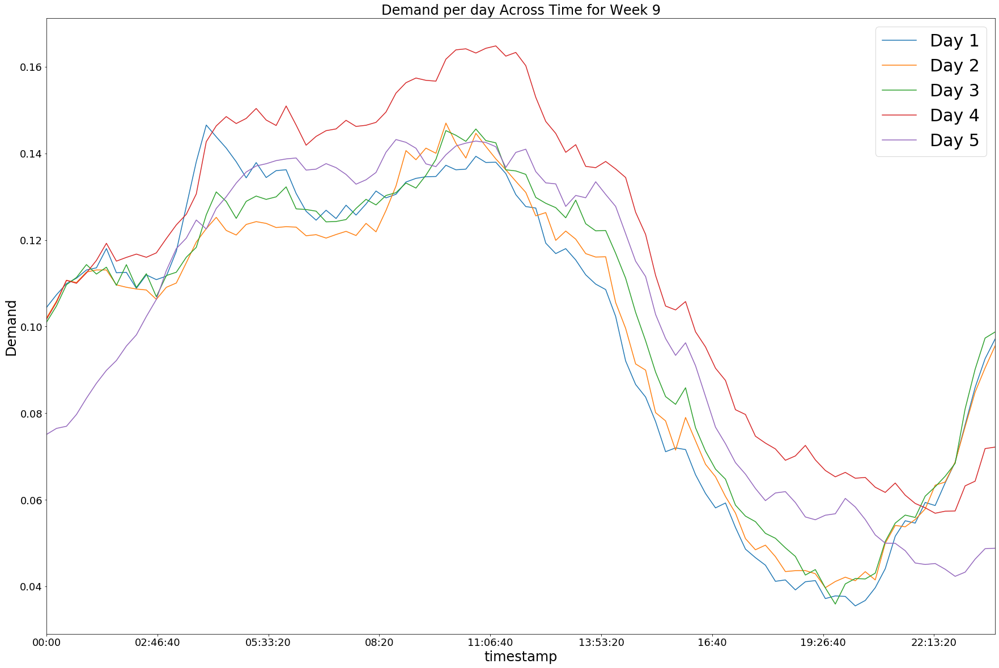

In [180]:
############### Week 1 #######################
fig, ax = plt.subplots()

ax.set_title('Demand per day Across Time for Week 1',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w1.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 2 #######################

fig2, ax2 = plt.subplots()

ax2.set_title('Demand per day Across Time for Week 2',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)


df_demand_w2.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax2,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax2.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 3 #######################

fig3, ax3 = plt.subplots()

ax3.set_title('Demand per day Across Time for Week 3',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w3.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax3,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax3.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 4 #######################

fig4, ax4 = plt.subplots()

ax4.set_title('Demand per day Across Time for Week 4',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w4.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax4,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax4.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 5 #######################

fig5, ax5 = plt.subplots()

ax5.set_title('Demand per day Across Time for Week 5',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w5.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax5,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax5.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 6 #######################

fig6, ax6 = plt.subplots()

ax6.set_title('Demand per day Across Time for Week 6',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w6.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax6,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax6.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 7 #######################

fig7, ax7 = plt.subplots()

ax7.set_title('Demand per day Across Time for Week 7',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w7.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax7,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax7.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 8 #######################

fig8, ax8 = plt.subplots()

ax8.set_title('Demand per day Across Time for Week 8',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w8.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax8,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax8.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)

############### Week 9 #######################

fig9, ax9 = plt.subplots()

ax9.set_title('Demand per day Across Time for Week 9',  fontdict={'fontsize': 24, 'fontweight': 'medium'})
plt.xlabel("Time", fontsize=24)
plt.ylabel("Demand", fontsize=24)

df_demand_w9.groupby('day').plot(x = "timestamp", y = "demand",
                     ax = ax9,
                     fontsize=18,
                     legend = True,
                     figsize=(30,20))

ax9.legend(["Day 1", "Day 2", "Day 3", "Day 4", "Day 5", "Day 6", "Day 7"], fontsize=30)
         
plt.show()

Remember that this is a mean demand; demand in some areas on some days in certain times can actually hit 1. Let us gather everything in our final section: Geography.

### Plotting demand and geography

In here, I plotted how demand changes with geography through an interactive Bokeh plot with sliders. Interact with it to see how demand changes with time and geography.

With time, the plot can also change views e.g. sliding based on weeks

In [9]:
from bokeh.plotting import *
from ipywidgets import interact
from bokeh.io import output_notebook, push_notebook, output_file, show, save

output_notebook()
source = ColumnDataSource(
    data = dict(
        lat = df[(df['timestamp_float'] == 0) & (df['day'] == 1)].longitude.values,
        lon = df[(df['timestamp_float'] == 0) & (df['day'] == 1)].latitude.values,
        radius = df[(df['timestamp_float'] == 0) & (df['day'] == 1)].demand.values * 50,
        )
    )
p = figure(background_fill_color="white", plot_height = 600, plot_width = 1000,
           x_range = (-5.5, -5.2), y_range = (90.58, 90.98))

# For contrast of regions
p.ygrid.band_fill_alpha = 0.1
p.ygrid.band_fill_color = "navy"

p.circle("lon","lat",source=source, alpha = 0.5, size = "radius",
        line_color="#FF0000", 
         fill_color="#FF0000",
         fill_alpha=0.05)

def update(time = 0, day = 1):
    new_data = {
        'lat'       : df[(df['timestamp_float'] == time) & (df['day'] == day)].longitude,
        'lon'       : df[(df['timestamp_float'] == time) & (df['day'] == day)].latitude,
        'radius' : df[(df['timestamp_float'] == time) & (df['day'] == day)].demand * 50
    }
    source.data = new_data
    push_notebook()

show(p, notebook_handle=True)

save(p)
output_file('GrabDemand.html', title='Demand across Day and Time')


interact(update, time=(0,23.75,0.25), day=(1,61))

Loading BokehJS ...

interactive(children=(FloatSlider(value=0.0, description='time', max=23.75, step=0.25), IntSlider(value=1, des…

<function __main__.update(time=0, day=1)>

The plot above was inspired by: https://engineering.grab.com/understanding-supply-demand-ride-hailing-data

__Contextual information about our data:__
“During the morning and evening peak hours, people want to head to town or return home from town. These are usually your executives and working professionals who mostly pay via GrabPay. During non-peak period between 1pm and 5pm, it would be trips within the heartland areas and most of the passengers would pay using cash.”

From: http://www.idrivegrab.com/one-veteran-drivers-secrets-to-success/

This seems to hold true, but surprisingly demand was high after working hours, even past midnight. Again, this might have to do with demand > supply?

__Insights about our data:__

It is a time series of “readings” at static georeferenced locations. Specifically, each row of data can be viewed as a time series because if we bin them into a spatial grid like we did and count the value of demand per grid square over time, this is analogous to having a fixed-location “sensor” at each square that counts the number of incidents at each time step. Therefore, is location just an index? This is a theme we shall carry on in our next notebook, Modelling.ipynb